# Analyse de la base de données du Vrai Débat


## Extraction depuis la bdd vers un format flat

```sql

```

## Préparation du texte

Pour l'analyse textuelle on effectue les étapes suivantes:

* convertir en minuscules;
* enlever les balises HTML;
* enlever les nombres;
* enlever les mots non informatifs ("le", "la", ...);
* remplacer la ponctuation par des espaces et éliminer les espaces consécutifs;
* raciner le texte (constitutionnellement > constitut);
* enlever les accents et caractères spéciaux;
* enlever des mots non-informatifs supplémentaires
  * "plus", "tout", "etre", "tous", "fair", "faut", "doit", "bien", "non", "donc"


In [3]:
library(data.table)
library(tm)
library(stringi)

Loading required package: NLP


In [4]:
d=fread("opinion.csv")

In [98]:
cleanFun <- function(htmlString) {
  return(gsub("<.*?>", "", htmlString))
}



gj=Corpus(VectorSource(d$V21))
docs=gj;
docs <- tm_map(docs, content_transformer(tolower))
docs=tm_map(docs, cleanFun)
docs_untrans=docs
docs <- tm_map(docs, removeNumbers)
docs=tm_map(docs, removeWords, stopwords("french"))
replacePunctuation <- content_transformer(function(x) {return (gsub("[[:punct:]]"," ", x))})

docs=tm_map(docs, replacePunctuation)
docs=tm_map(docs, stripWhitespace)
docs=tm_map(docs, stemDocument, language="fr")
#docs=tm_map(docs, iconv, from="UTF-8",to="ASCII//TRANSLIT")
docs=tm_map(docs, stri_trans_general, "Latin-ASCII")
torem=c("plus", "tout", "etre", "tous", "fair", "faut", "doit", "bien", "non", "donc")
docs=tm_map(docs, removeWords, torem)

dtm=TermDocumentMatrix(docs)
m=as.matrix(dtm)
mots=rowSums(m)


Warning message in tm_map.SimpleCorpus(docs, content_transformer(tolower)):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, cleanFun):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeNumbers):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, replacePunctuation):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stemDocument, language = "fr"):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stri_trans_general, "Latin-ASCII"):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, torem):
“transformation drops documents”

## Longueur des propositions

Ici on utilise la base de données non transformée pour être sûr de compter tous les mots.

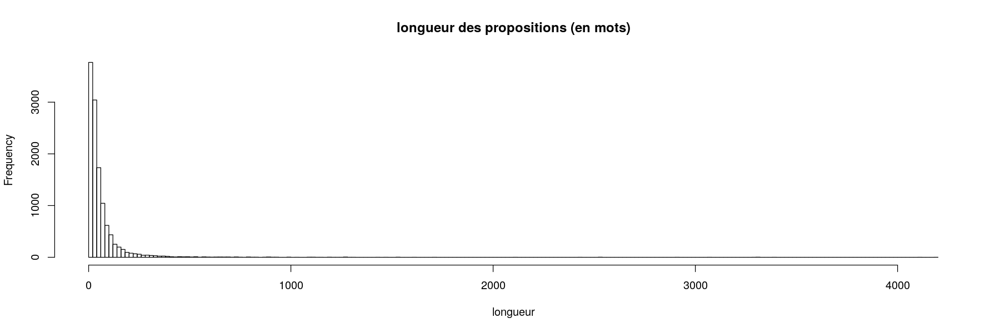

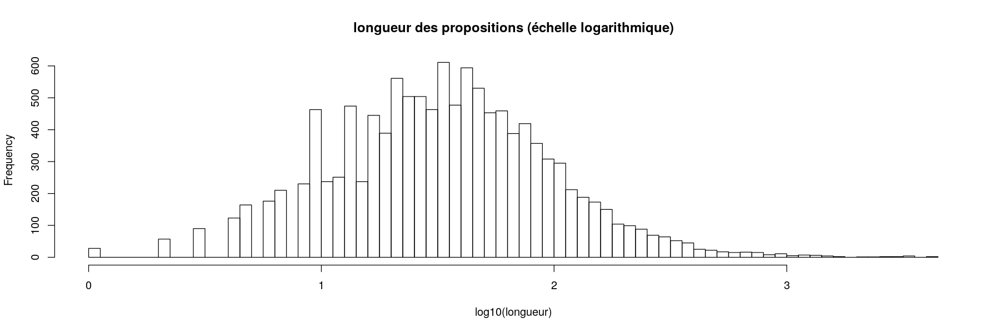

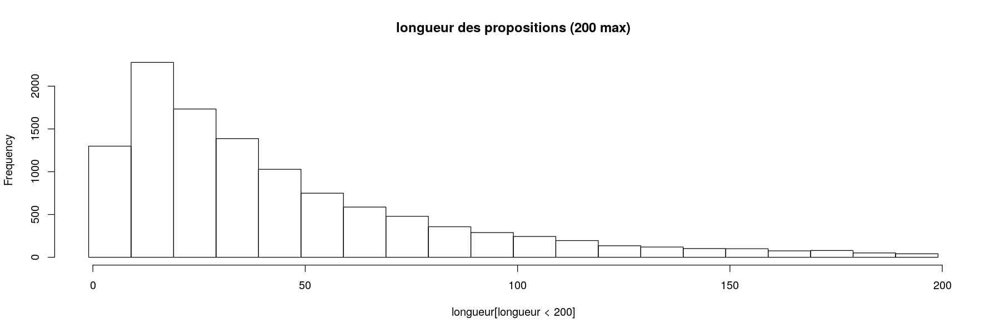

In [7]:
options(repr.plot.width=15, repr.plot.height=5)
dtm=TermDocumentMatrix(docs_untrans)
m=as.matrix(dtm)
mots=rowSums(m)
longueur=colSums(m)
hist(longueur, breaks=200, main="longueur des propositions (en mots)")
hist(log10(longueur), breaks=100, main="longueur des propositions (échelle logarithmique)")
hist(longueur[longueur<200], breaks=seq(-1, 200, by=10), main="longueur des propositions (200 max)")


In [21]:
length(longueur[longueur<200])/length(longueur)

[1] 0.9511294

<div class="alert alert-success">
<strong> Conclusion 1 : </strong> La grande majorité (95%) des propositions est très courte (moins de 50 mots). Si la plupart tiennent en une phrase, on en trouve de très longues, comme par exemple une proposition de constitution complète (4000 mots).
    </div>

In [34]:
d$V21[1]

[1] "<ol><li><strong>Constitutionnaliser la règle verte</strong> : ne pas prélever sur la nature davantage que ce qu'elle peut reconstituer, ni produire plus que ce qu'elle peut supporter.</li><li><strong>Protéger les biens communs : l'air, l'eau, l'alimentation, le vivant, la santé, l'énergie, la monnaie ne sont pas des marchandises. Ils doivent être gérés démocratiquement </strong>: le droit de propriété doit être soumis à l'intérêt général, la propriété commune protégée et les services publics développés.</li><li><strong>Constitutionnaliser et rendre effectifs les droits au travail et au logement.</strong></li><li>Amnistier les syndicalistes et militants associatifs condamnés pour faits de luttes sociales, écologiques ou pour la défense des libertés, <strong>protéger les lanceurs d'alerte et investir les salariés d'une mission d'alerte sociale et environnementale.</strong></li></ol>"

Ce qui donne en HTML:


<ol><li><strong>Constitutionnaliser la règle verte</strong> : ne pas prélever sur la nature davantage que ce qu\'elle peut reconstituer, ni produire plus que ce qu\'elle peut supporter.</li><li><strong>Protéger les biens communs : l\'air, l\'eau, l\'alimentation, le vivant, la santé, l\'énergie, la monnaie ne sont pas des marchandises. Ils doivent être gérés démocratiquement </strong>: le droit de propriété doit être soumis à l\'intérêt général, la propriété commune protégée et les services publics développés.</li><li><strong>Constitutionnaliser et rendre effectifs les droits au travail et au logement.</strong></li><li>Amnistier les syndicalistes et militants associatifs condamnés pour faits de luttes sociales, écologiques ou pour la défense des libertés, <strong>protéger les lanceurs d\'alerte et investir les salariés d\'une mission d\'alerte sociale et environnementale.</strong></li></ol>

<div class="alert alert-warning">
<strong> Conclusion 1.a : </strong>Il va falloir différencier entre les propositions qui n'en contiennent qu'une (la plupart) et celles qui définissent un programme. (Idée:Si c'est fait de façon structurée on peut utiliser les balises HTML après une classification?)
    </div>
    
### Addendum: propositions courtes

In [37]:
head(longueur[longueur<3], 20)
head(d$V21[longueur<3], 20)
length(longueur[longueur<3])
length(longueur[longueur<3])/length(longueur)

99  170  194  208  314  804  872  894  952 1463 1644 1970 2013 2226 2292 2548 
   2    1    2    2    1    1    2    2    1    2    2    2    1    2    1    1 
2679 2686 2852 2986 
   2    2    1    0

[1] "<p>supprimer le sénat </p>"                                                                                                                                                                                                  
 [2] "<p>https://www.avendrealouer.fr/conseils/le-scandale-des-tarifs-de-syndics-fait-polemique/</p>"                                                                                                                              
 [3] "<p>Macron démission</p>"                                                                                                                                                                                                     
 [4] "<p>Renationaliser TF1</p>"                                                                                                                                                                                                   
 [5] "<p>Référendum</p>"                                                                                                                                                                                                           
 [6] "<p>---</p>"                                                                                                                                                                                                                  
 [7] "<p>frexit viiiiiiiiiiiiiiite</p>"                                                                                                                                                                                            
 [8] "<p>Rétablir la proportionnelle ,</p>"                                                                                                                                                                                        
 [9] "<p>https://fr.wikipedia.org/wiki/V%C3%A9hicule_%C3%A0_air_comprim%C3%A9</p>"                                                                                                                                                 
[10] "<p>L'art partout </p>"                                                                                                                                                                                                       
[11] "<p>Supprimer le CICE</p>"                                                                                                                                                                                                    
[12] "<p>Changer de republique</p>"                                                                                                                                                                                                
[13] "<p><a href=\\\"https://docs.google.com/document/d/1L3brCDTp1PwjTzwD0qKv6705U9HF5utdLXwx8svE5H4/edit?usp=sharing\\\">https://docs.google.com/document/d/1L3brCDTp1PwjTzwD0qKv6705U9HF5utdLXwx8svE5H4/edit?usp=sharing</a></p>"
[14] "<p>demission de macron</p>"                                                                                                                                                                                                  
[15] "<p>https://www.youtube.com/watch?v=B1QEdhGN8ag</p><p><br /></p>"                                                                                                                                                             
[16] "<p>https://www.lci.fr/politique/casier-vierge-pour-les-elus-pourquoi-la-majorite-a-abandonne-la-promesse-de-macron-2059537.html</p>"                                                                                         
[17] "<p>SUPPRIMER LA REDEVANCE TV</p>"                                                                                                                                                                                            
[18] "<p>suppression du CICE</p><p><br /></p>"                                                                               

[1] 88

[1] 0.007389369

<div class="alert alert-success">
<strong> Conclusion 2 : </strong> Pour certaines propositions, le sens est contenu dans le titre, et le corps n'est qu'un lien ou est entièrement vide. 88 (0.007%) ont 0,1 ou 2 mots.
    </div>

## Analyse lexicographique

Ici on se sert du jeu de données épuré.

In [59]:
dtm=TermDocumentMatrix(docs)
m=as.matrix(dtm)
mots=rowSums(m)

In [60]:
options(repr.plot.width=15, repr.plot.height=5)
longueur=colSums(m)


franc      etat      autr      comm   citoyen     impot   retrait      part 
     4077      2587      2385      2381      2273      1960      1950      1847 
   social       pay    person entrepris       tax      fait     grand   pouvoir 
     1816      1813      1804      1783      1744      1736      1731      1690 
    polit    salair       pai    fiscal 
     1644      1609      1550      1538

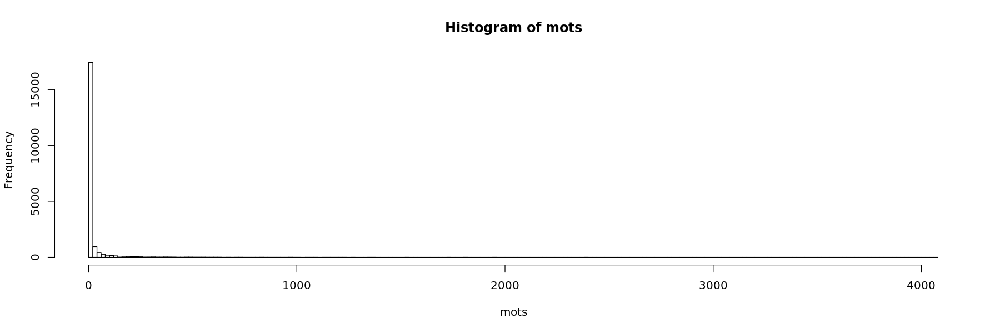

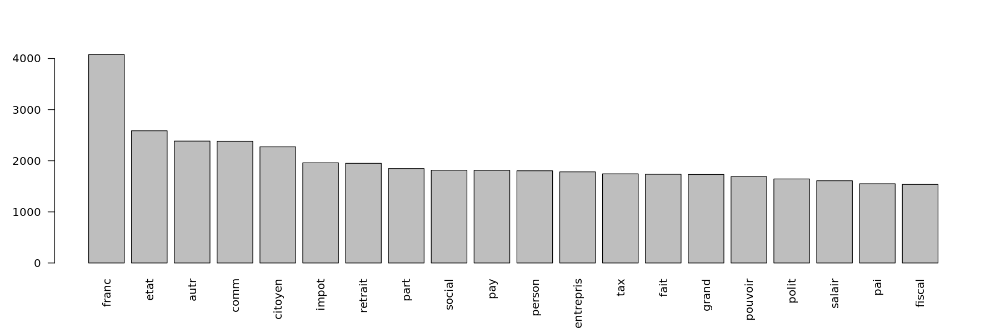

In [86]:
hist(mots, breaks=200)
head(mots[order(mots, decreasing=T)], 20)
barplot(head(mots[order(mots, decreasing=T)], 20), las=2)


In [51]:
mots[rank(mots)==2]

named numeric(0)

Impôt et retraite sont les deux mots à haute teneur en information les plus fréquents dans les revendications. On peut faire la même analyse stratifiée par thème.

## Analyse de fréquence stratifiée par thème

In [82]:
hd=fread("header", header=F)$V1
colnames(d)=hd
optype=fread("opinion_type.csv", header=F)
d$optype=optype$V2[match(as.character(d$opinion_type), optype$V1)]


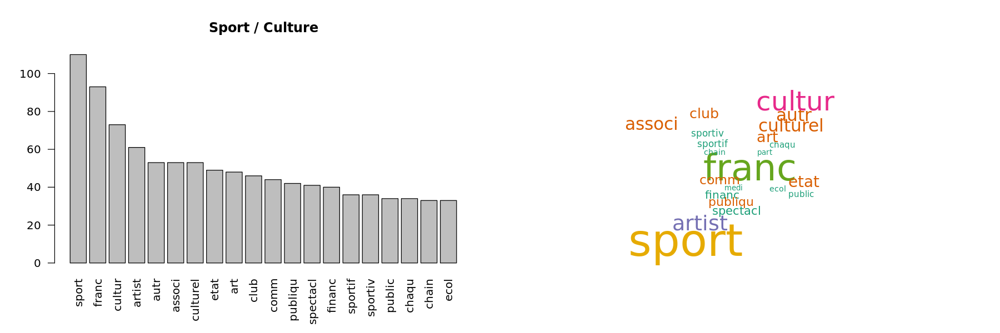

Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“europeen could not be fit on page. It will not be plotted.”

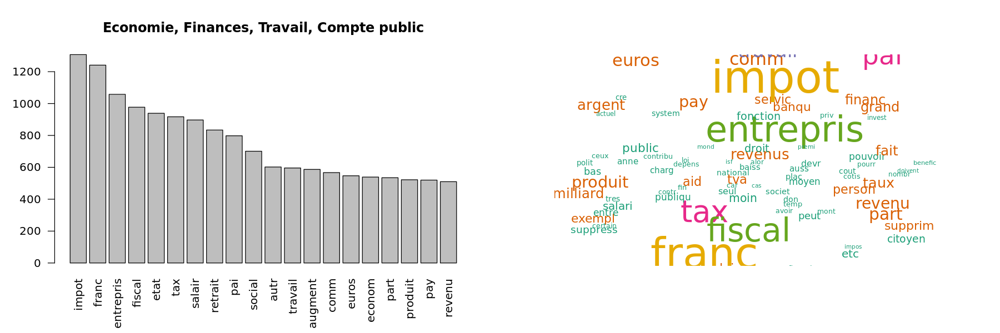

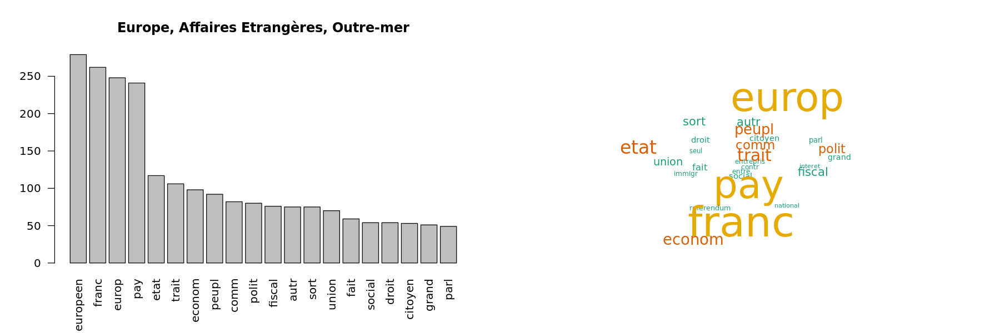

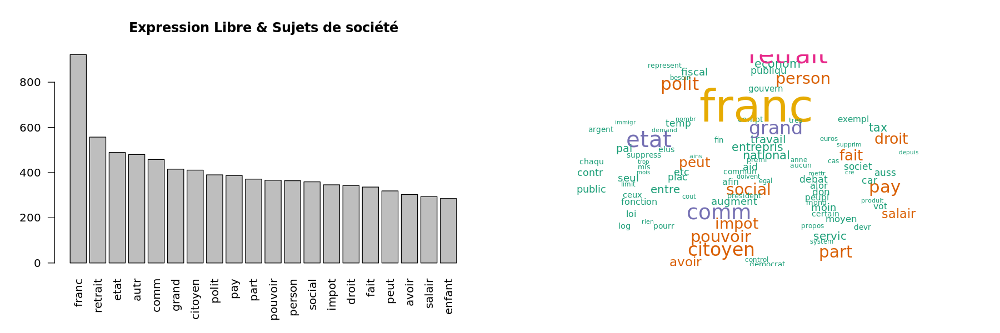

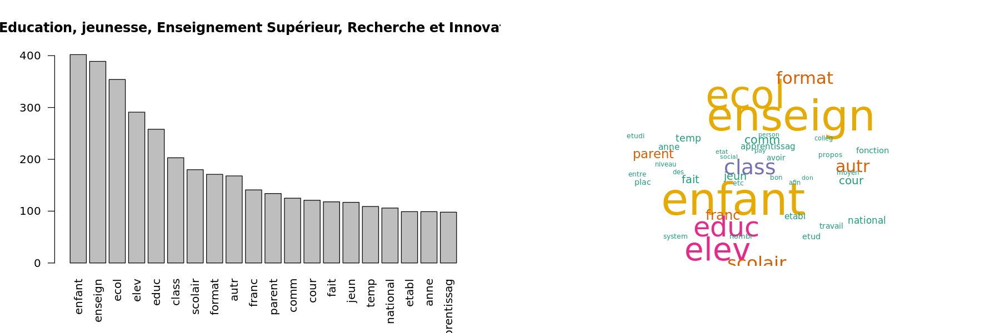

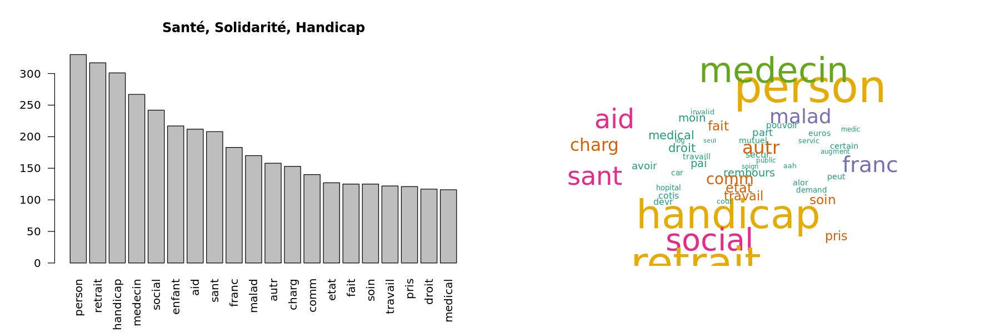

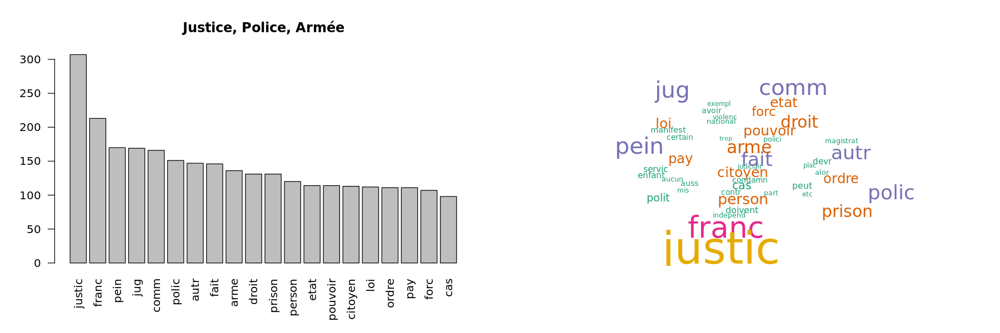

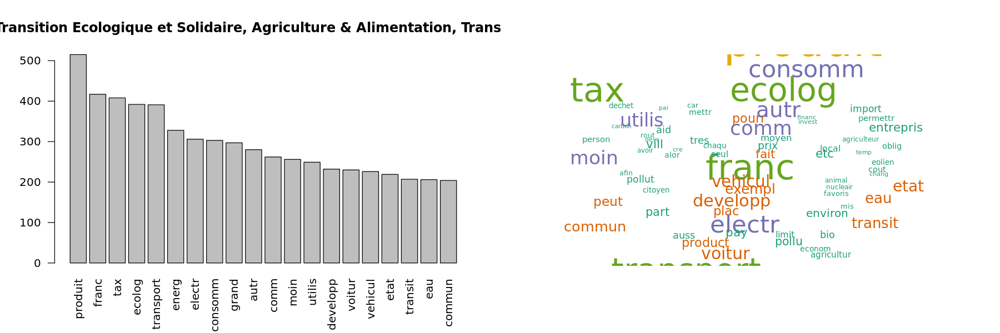

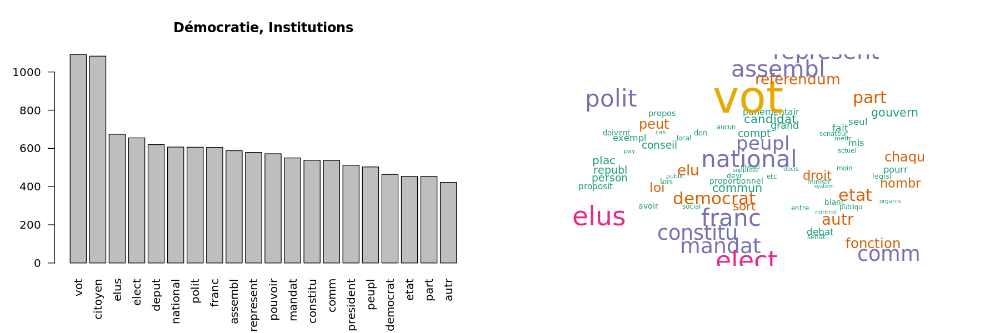

In [122]:
for(otype in optype$V2){
    dmin=docs[((1:nrow(d))[d$optype==otype])]
    dtm=TermDocumentMatrix(dmin)
    m=as.matrix(dtm)
    mots=rowSums(m)
    par(mfrow=c(1,2))
    barplot(head(mots[order(mots, decreasing=T)], 20), las=2, main=otype)
    mmots=mots[mots>quantile(mots, 0.99)]
mmots=mmots-quantile(mots, 0.99)+1
wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), fixed.asp=F, rot.per=0)
}

## Proportion de réponses par thème

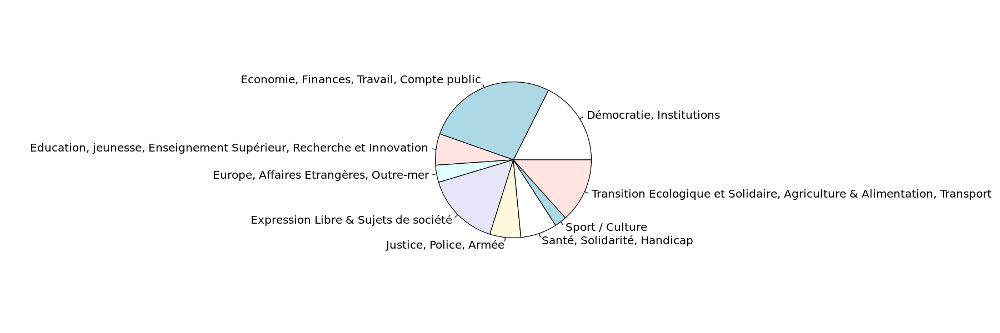

In [95]:
pie(table(d$optype))

In [ ]:
library(hunspell)

## Deuxième option: correction et lemmatisation

Re-lisons le jeu de données sans raciner ni toucher aux majuscules.

In [21]:
library(hunspell)
library(data.table)
library(tm)
library(stringi)

In [22]:
d=fread("opinion.csv")

In [23]:
cleanFun <- function(htmlString) {
  return(gsub("<.*?>", "", htmlString))
}

gj=Corpus(VectorSource(d$V21))
docs=gj;
#docs <- tm_map(docs, content_transformer(tolower))
docs=tm_map(docs, cleanFun)
docs_untrans=docs
docs <- tm_map(docs, removeNumbers)
docs=tm_map(docs, removeWords, stopwords("french"))
replacePunctuation <- content_transformer(function(x) {return (gsub("[[:punct:]]"," ", x))})

docs=tm_map(docs, replacePunctuation)
docs=tm_map(docs, stripWhitespace)

Warning message in tm_map.SimpleCorpus(docs, cleanFun):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeNumbers):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, replacePunctuation):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”

In [5]:
### ATTENTION ###
### TRES LONG ###
# NE REEXECUTER QU'EN CAS DE BESOIN
errors=sapply(docs, function(x){hunspell(x, dict="fr")})


Nous venons de valider les réponses orthographiquement, ce qui nous permet de répertorier les fautes (mots inconnus) et de les corriger.

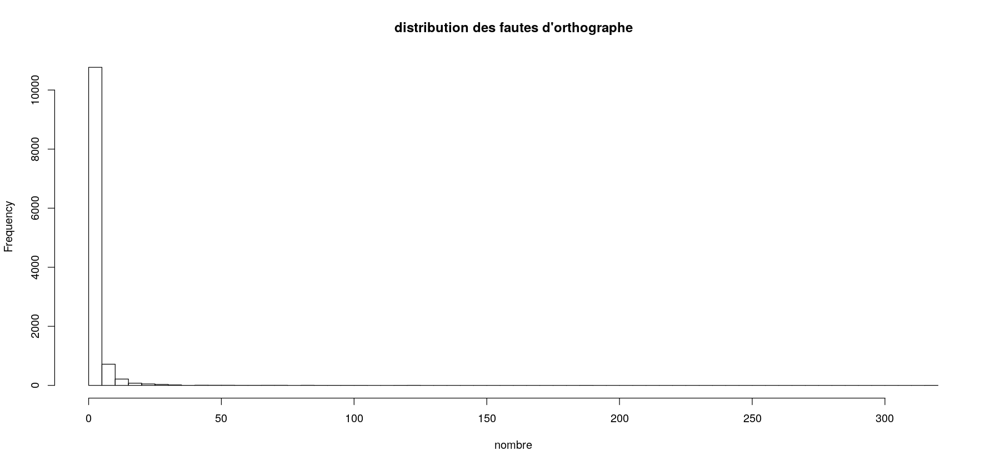

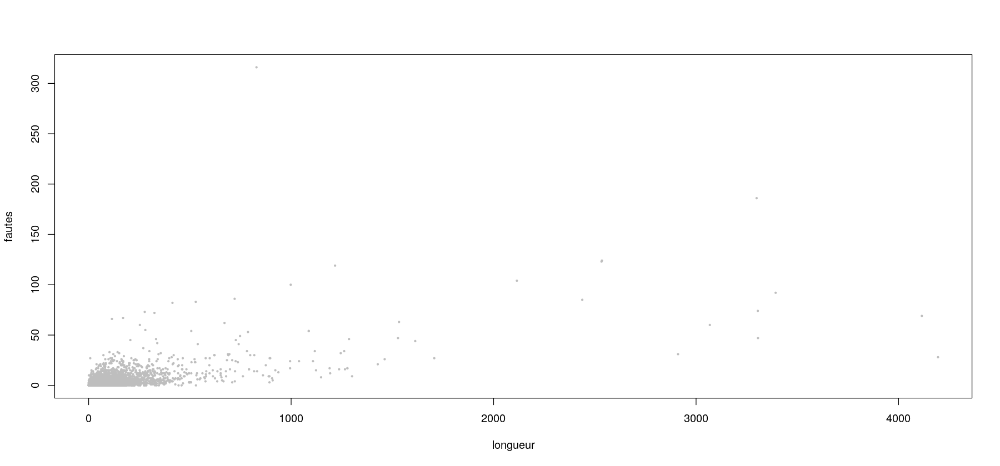

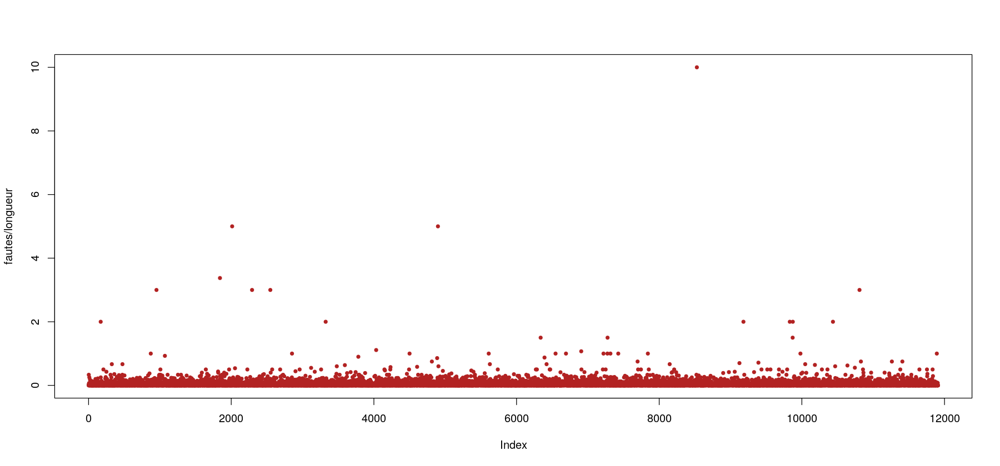

In [8]:
options(repr.plot.width=15, repr.plot.height=7)
fautes=unlist(lapply(errors, length))
hist(fautes, main="distribution des fautes d'orthographe", xlab="nombre", breaks=100)
plot(longueur, fautes, pch=20, cex=0.5, col="gray")
plot(fautes/longueur, pch=20, col="firebrick")

On s'attend à maximum 1 faute/mot, mais nombre de propositions dépassent cette valeur, y compris une contenant plus de 300 fautes. Après examen, il s'agit d'un artefact causé par des liens hypertexte:

In [9]:
(1:length(fautes))[fautes==max(fautes)]
d$V21[[5554]]
errors[5554]

[1] 5554

[1] "<p><strong>Loi de PARETO du Totalitarisme Macronien : </strong></p><p><strong>P-C.RACAMIER « Les perversions narcissiques » : «Alors que la pensée est toute faite de liaisons, la pensée perverse n’opère que dans la disjonction et dans la déliaison… autour d’un noyau pervers, il n’est plus rien qui puisse être tenu pour vrai, ni même pour vérifiable». </strong></p><p><br /></p><p><a href=\\\"https://planetes360.fr/president-pas-par-hasard/\\\"><strong>https://planetes360.fr/president-pas-par-hasard/</strong></a><strong> </strong></p><p><a href=\\\"http://antitotalitarisme.over-blog.com/2018/12/le-president-du-bilderberg-petitionne-contre-les-gilets-jaunes-c-est-enorme-c-est-le-signal-systemique-du-siecle.html\\\"><strong>http://antitotalitarisme.over-blog.com/2018/12/le-president-du-bilderberg-petitionne-contre-les-gilets-jaunes-c-est-enorme-c-est-le-signal-systemique-du-siecle.html</strong></a></p><p><a href=\\\"http://antitotalitarisme.over-blog.com/2018/12/1/3-de-siecle-de-pourrissement-sur-pied-de-la-france.html\\\"><strong>http://antitotalitarisme.over-blog.com/2018/12/1/3-de-siecle-de-pourrissement-sur-pied-de-la-france.html</strong></a><strong> </strong></p><p><a href=\\\"http://www.leparisien.fr/economie/les-gilets-jaunes-ecrivent-a-macron-dans-une-lettre-ouverte-et-lancent-l-acte-8-03-01-2019-7980618.php#xtor=AD-1481423553\\\"><strong>http://www.leparisien.fr/economie/les-gilets-jaunes-ecrivent-a-macron-dans-une-lettre-ouverte-et-lancent-l-acte-8-03-01-2019-7980618.php#xtor=AD-1481423553</strong></a></p><p><a href=\\\"http://antitotalitarisme.over-blog.com/2018/11/philippe-devrait-etre-prudent-dans-l-affichage-du-viol-de-masse-de-l-article-3-de-la-constitution.canard-21/11/18-p8-il-doit-choisir\\\"><strong>http://antitotalitarisme.over-blog.com/2018/11/philippe-devrait-etre-prudent-dans-l-affichage-du-viol-de-masse-de-l-article-3-de-la-constitution.canard-21/11/18-p8-il-doit-choisir</strong></a></p><p><a href=\\\"http://antitotalitarisme.over-blog.com/2018/11/herve-de-courreges-emmanuel-germain-nicolas-le-nen-principes-de-contre-insurrection-page-11-une-pseudo-operation-consiste-a-executer\\\"><strong>http://antitotalitarisme.over-blog.com/2018/11/herve-de-courreges-emmanuel-germain-nicolas-le-nen-principes-de-contre-insurrection-page-11-une-pseudo-operation-consiste-a-executer</strong></a></p><p><a href=\\\"http://antitotalitarisme.over-blog.com/2018/11/il-est-inadmissible-que-nous-payons-un-president-pour-prendre-son-pied-a-des-rapports-sadomasos-avec-le-peuple-seul-souverain-et-pou\\\"><strong>http://antitotalitarisme.over-blog.com/2018/11/il-est-inadmissible-que-nous-payons-un-president-pour-prendre-son-pied-a-des-rapports-sadomasos-avec-le-peuple-seul-souverain-et-pou</strong></a><strong> </strong></p><p><a href=\\\"http://beynost.over-blog.com/article-societe-de-thule-et-lucifer-abc-meme-combat-101404396.html\\\"><strong>http://beynost.over-blog.com/article-societe-de-thule-et-lucifer-abc-meme-combat-101404396.html</strong></a><strong> </strong></p><p><a href=\\\"http://antitotalitarisme.over-blog.com/2018/05/palmares-de-la-nebuleuse-occulte-occultiste-en-matieres-de-genocides-et-de-massacres-de-masse.html\\\"><strong><u>http://antitotalitarisme.over-blog.com/2018/05/palmares-de-la-nebuleuse-occulte-occultiste-en-matieres-de-genocides-et-de-massacres-de-masse.html</u></strong></a></p><p><strong><u>https://www.polemia.com/84-milliards-cout-budgetaire-de-limmigration-selon-le-rapport-posokhow/</u></strong></p><p><a href=\\\"https://www.lemonde.fr/idees/article/2019/01/01/mounir-mahjoubi-et-les-gilets-jaunes-elevons-nous-a-la-hauteur-des-francais_5404200_3232.html\\\"><strong><u>https://www.lemonde.fr/idees/article/2019/01/01/mounir-mahjoubi-et-les-gilets-jaunes-elevons-nous-a-la-hauteur-des-francais_5404200_3232.htm</u></strong></a></p><p><br /></p><p><strong>Compléments de contexte : </strong></p><p><a href=\\\"http://www.angelfire.com/wizard2/solidaires/freres.html\\\"><strong>Le plus jeune franc-maçon de Fr

[[1]]
  [1] "Macronien"            "RACAMIER"             "déliaison"           
  [4] "planetes"             "president"            "antitotalitarisme"   
  [7] "over"                 "president"            "bilderberg"          
 [10] "petitionne"           "enorme"               "systemique"          
 [13] "siecle"               "htmlhttp"             "antitotalitarisme"   
 [16] "over"                 "siecle"               "france"              
 [19] "leparisien"           "economie"             "ecrivent"            
 [22] "php"                  "xtor"                 "antitotalitarisme"   
 [25] "over"                 "philippe"             "etre"                
 [28] "choisirhttp"          "antitotalitarisme"    "over"                
 [31] "herve"                "courreges"            "emmanuel"            
 [34] "nicolas"              "nen"                  "operation"           
 [37] "executerhttp"         "antitotalitarisme"    "over"                
 [40] "president"            "sadomasos"            "beynost"             
 [43] "over"                 "societe"              "thule"               
 [46] "lucifer"              "meme"                 "antitotalitarisme"   
 [49] "over"                 "palmares"             "nebuleuse"           
 [52] "matieres"             "genocides"            "htmlhttps"           
 [55] "polemia"              "cout"                 "budgetaire"          
 [58] "limmigration"         "posokhow"             "lemonde"             
 [61] "idees"                "mounir"               "mahjoubi"            
 [64] "elevons"              "francais"             "htmCompléments"      
 [67] "compagnehttp"         "antitotalitarisme"    "over"                
 [70] "trump"                "achetes"              "sublimeurs"          
 [73] "angelfire"            "wizard"               "htmlhttps"           
 [76] "beynost"              "wordpress"            "dvd"                 
 [79] "quils"                "shoah"                "francais"            
 [82] "dvd"                  "bibliotheque"         "lavenir"             
 [85] "dvd"                  "angelfire"            "wizard"              
 [88] "htmlhttps"            "beynost"              "wordpress"           
 [91] "beynost"              "wordpress"            "obama"               
 [94] "lukraine"             "roosevelt"            "churchill"           
 [97] "ete"                  "shoah"                "herriot"             
[100] "lholodomor"           "lemonde"              "htmlhttp"            
[103] "ecrans"               "liberation"           "ecrans"              
[106] "shoah"                "wikipedia"            "Auschwitzhttp"       
[109] "jewishvirtuallibrary" "jsource"              "Holocaust"           
[112] "bombau"               "htmlhttp"             "jewishvirtuallibrary"
[115] "jsource"              "Holocaust"            "augas"               
[118] "htmlhttp"             "wikipedia"            "Operation"           
[121] "Frantichttp"          "wikipedia"            "Operation"           
[124] "ParavaneLa"           "thinking"             "holacracy"           
[127] "Ecole"                "Palo"                 "GALLWEY"             
[130] "Malarewicz"           "oeuvre"               "How"                 
[133] "to"                   "at"                   "work"                
[136] "KELLEY"               "Labs"                 "Colombus"            
[139] "SELMER"               "oeuvre"               "The"                 
[142] "end"                  "of"                   "PIZDEK"              
[145] "amp"                  "GETZ"                 "ESCP"                
[148] "CARNEY"               "Wall"                 "Street"              
[151] "KELLEY"               "IDEO"                 "Palo"                
[154] "Emile"                "SERVAN"               "SCHREIBER"           
[157] "Reinventing"          "Organizations"        "LALOUX"              
[160] "Holacracy"  

In [120]:
tropfautes=(d$V21[fautes/longueur>1])
head(tropfautes)

[1] "<p>https://www.avendrealouer.fr/conseils/le-scandale-des-tarifs-de-syndics-fait-polemique/</p>"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
[2] "<p>https://fr.wikipedia.org/wiki/V%C3%A9hicule_%C3%A0_air_comprim%C3%A9</p>"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
[3] "<p>Faire baisser le niveau de fiscalité en France de manière simple !</p><p><br /></p><p>https://www.ladepeche.fr/article/2018/12/10/2922207-micro-taxe-paiements-electroniques-supprimer-tva.html</p><p><br /></p><p>https://www.google.com/url?sa=t&amp;rct=j&amp;q=&amp;esrc=s&amp;source=web&amp;cd=8&amp;ved=2ahUKEwjlxIPIkaDgAhUKrxoKHWXtCusQFjAHegQIARAC&amp;url=https%3A%2F%2Fwww.ppur.org%2Freviews%2Fdownload%2F435%3Fproduct_id%3D726&amp;usg=AOvVaw3HxEHVXs8_W0MTjcSux7XU</p><p><br /></p><p>https://lamonnaie.ch/marc-chesney-face-cache-de-finance/</p><p><br /></p><p><br /></p>"
[4] "<p><a href=\\\"https://docs.google.com/document/d/1L3brCDTp1PwjTzwD0qKv6705U9HF5utdLXwx8svE5H4/edit?usp=sharing\\\">https://docs.google.com/document/d/1L3brCDTp1PwjTzwD0qKv6705U9HF5utdLXwx8svE5H4/edit?usp=sharing</a></p>"                                                                                                                                                                                                                                                                                                                                                                   
[5] "<p>https://www.youtube.com/watch?v=B1QEdhGN8ag</p><p><br /></p>"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
[6] "<p>https://www.lci.fr/politique/casier-vierge-pour-les-elus-pourquoi-la-majorite-a-abandonne-la-promesse-de-macron-2059537.html</p>"

Il s'agit de liens. Les liens de blogs/journaux contiennent des tirets, qui sont interprétés comme des séparations de mots.

## Exclusion des adresses web

In [24]:
removeLinks = function(string){
  return(gsub(" ?(f|ht)(tp)(s?)(://)(.*)[.|/](.*)", " ", string))  
}

removeChars <- function(htmlString) {
  return(gsub("&.*?;", " ", htmlString))
}


cleanFun <- function(htmlString) {
  return(gsub("<.*?>", " ", htmlString))
    
}



gj=Corpus(VectorSource(d$V21))
docs=gj;
#docs <- tm_map(docs, content_transformer(tolower))
docs=tm_map(docs, cleanFun)
docs=tm_map(docs, removeLinks)
docs=tm_map(docs, removeChars)
docs_untrans=docs
#docs <- tm_map(docs, removeNumbers)
docs=tm_map(docs, removeWords, stopwords("french"))
replacePunctuation <- content_transformer(function(x) {return (gsub("[[:punct:]]"," ", x))})

docs=tm_map(docs, replacePunctuation)
docs=tm_map(docs, stripWhitespace)

Warning message in tm_map.SimpleCorpus(docs, cleanFun):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeLinks):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeChars):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, replacePunctuation):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”

On vérifie si tout a bien fonctionné:

In [25]:
### ATTENTION ###
### TRES LONG ###
# NE REEXECUTER QU'EN CAS DE BESOIN
errors=sapply(docs, function(x){hunspell(x, dict="fr")})


In [26]:
dtm=TermDocumentMatrix(docs_untrans)
m=as.matrix(dtm)
mots=rowSums(m)
longueur=colSums(m)

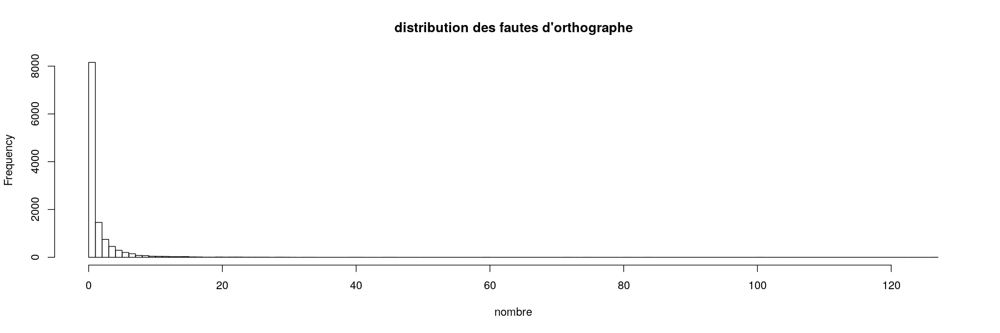

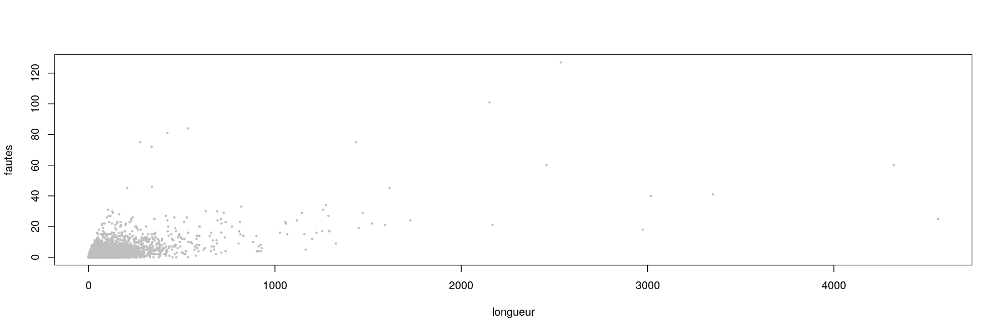

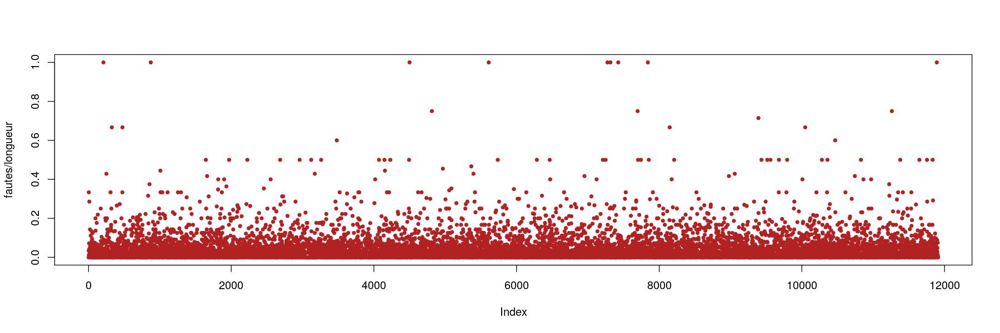

In [27]:
options(repr.plot.width=15, repr.plot.height=5)
fautes=unlist(lapply(errors, length))
hist(fautes, main="distribution des fautes d'orthographe", xlab="nombre", breaks=100)
plot(longueur, fautes, pch=20, cex=0.5, col="gray")
plot(fautes/longueur, pch=20, col="firebrick")

In [28]:
tropfautes=(docs_untrans[fautes/longueur>0.5 & longueur>0]$content)
tropfautes
(1:length(docs_untrans))[fautes/longueur>0.5 & longueur>0]


[1] " Renationaliser TF1 "                                              
 [2] " Decentralisation  type Federalisme "                              
 [3] " suprimer le ministere de la justice "                             
 [4] " frexit viiiiiiiiiiiiiiite "                                       
 [5] " Lutter cdontre le cjomage me parait essenciel "                   
 [6] " lll "                                                             
 [7] " Taxer les GAFA      Google,Amazon,Facebook,Apple....... "         
 [8] " Legalisation "                                                    
 [9] " FREXIT  urgenttttttttttttttttt "                                  
[10] " Retablissement de l'ISF  "                                        
[11] " EQUITE "                                                          
[12] " DECALER LES LEGISLATIVES DE LA PRESIDENTIELLE "                   
[13] " RiC "                                                             
[14] " sortie de l'europe de la france  "                                
[15] " REPRISE DU CONTROLE DE LA CREATION MONETAIRE PAR L'ETAT FRANCAIS "
[16] " semaine de 30 h duree legale "                                    
[17] " 6eme republique et assemblee constituante  programme FI "         
[18] " assemblee constituante et 6eme republique "                       
[19] " Ric "

[1]   208   326   475   872  3480  4500  4813  5610  7274  7316  7426  7697
[13]  7841  8147  9391 10047 10467 11262 11892

### Récupération des fausses fautes

Si une faute se reproduit un grand nombre de fois (RIC, Brexit, Frexit) on peut la récupérer. Cela vaut aussi pour les acronymes.


In [29]:
table_erreurs=table(tolower(unlist(errors)))
head(sort(table_erreurs, decreasing=T), 100)


          etat            hui        aujourd            csg            isf 
           759            715            710            366            310 
           ric           etre           cice           smic         impots 
           247            197            163            137            133 
        oeuvre         france           meme          etats            aah 
           114            112            104            102             98 
           tva            caf          impot           sécu     plateforme 
            98             88             87             81             77 
            ca           cout            ect            tpe              ð 
            76             69             64             64             63 
      francais            ena           cndp         europe              ø 
            63             61             60             59             57 
         ehpad           elus           gafa            apl        chaines 
           

On a des mots non correctibles par logiciel mais récupérables: CSG, ISF RIC TVA CAF ...
Même pour les mots soi-disant correctibles on ne peut pas toujours faire confiance à la suggestion et il vaut mieux les récupérer manuellement.

In [30]:
cos=unlist(lapply(errors, function(x){if('co' %in% x){return(T)}else{return(F)}}))
head(d$V21[cos])

[1] "<pre class=\\\"ql-syntax\\\">Annuler le projet. \\\nCe projet n'apportera AUCUNE choses positives à la Guyane, seulement des externalités négatives (pollution minière. Regardez l'exemple actuel au Brésil). Une multinationale Russo cannadienne n'est pas l'acteur dont le Guyane a besoin pour se développer. C'est envoyer de la poudre de perlipimpim aux yeux des guyanais et de leur élus, de leur faire miroiter que l'or, le pétrole &amp; co est la réponse à leurs soucis. Je suis indignée que, par les temps qui court, où notre planête devrait être au centre de nos préoccupations (avec bien sûr la justice sociale), et avec un président \\\"champion de la terre\\\", ce projet n'ait pas encore été stoppé.\\\n</pre>"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     
[2] "<p>Je souhaite une remise en cause profonde des retraites accordees aux hommes politiques, prefets, hommes d affaires nommes dans les grands groupes.</p><p>tous ces gens beneficient d avantages inconsideres pendant des periodes trop longues, a vie pour certains, alors que nous, nous avons perdu l annee de remuneration apres une perte d emploi et nos retraites dminuent comme une peau de chagrin.</p><p>en effet 4 ex presidents de la republique, nombre de senateurs, de parlementaires plus toute la clique de copains biens places a chaque terme electoral nous privent d une manne co siderable pour faire avancer les choses en France.</p>"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [31]:
hunspell_suggest("sécu", dict="fr")
motsaufs=c("csg", "isf", "ric", "cice", "smic", "tva", "tpe", "ehpad", "ena", "cndp", "apl", "mdph", "glyphosate", "pma", 
           "benalla", "pme", "pmi", "jouanno", "bce", "aspa", "lrem", "thc", "csa")

[[1]]
[1] "sucé"  "écu"   "écus"  "vécu"  "s écu"

### Correction

Ici on applique une règle approximative: on remplace les mots erronés par leur suggestion, sauf dans les cas ci-dessus.


In [32]:
selfcorr = c("sécurité", "sécurité", "", "", "économie", "économie", "kilomètre", "milliard", "agroalimentaire", "dioxyde", "")
names(selfcorr)=c("sécu", "secu", "ème", "eme", "éco", "eco", "km", "mds", "agro", "co2", "ni")

In [33]:
selfcordict=split(unname(selfcorr),names(selfcorr))
selfcordict

$agro
[1] "agroalimentaire"

$co2
[1] "dioxyde"

$eco
[1] "économie"

$éco
[1] "économie"

$eme
[1] ""

$ème
[1] ""

$km
[1] "kilomètre"

$mds
[1] "milliard"

$ni
[1] ""

$secu
[1] "sécurité"

$sécu
[1] "sécurité"

In [34]:
replace_words=function(string, dict, i=length(dict)){
    if(i==1){return(gsub(paste0('\\b', names(dict)[1], '\\b'), dict[1], string))}
    else{return(gsub(paste0('\\b', names(dict)[i], '\\b'), dict[names(dict)[i]], replace_words(string, dict, i-1)))}    
}
replace_words_nothing=function(string, dict, i=length(dict)){
    if(i==1){return(gsub(paste0('\\b', dict[1], '\\b'), " ", string))}
    else{return(gsub(paste0('\\b', dict[1], '\\b'), " ", replace_words(string, dict, i-1)))}    
}



In [35]:
library(gsubfn)
correction =function (x){
for (wd in setdiff(unlist(hunspell(x, dict="fr")), motsaufs)){
  x=gsub(paste0('\\b', wd, '\\b'), unlist(hunspell_suggest(wd, dict="fr"))[1] ,x)  
}
}
correct_text =function (content){paste(sapply(strsplit(tolower(content), " ", fixed=T)[[1]], correction), collapse=' ')}
corrected=tm_map(docs, tolower)
corrected=tm_map(corrected, replace_words, selfcorr)

Warning message in tm_map.SimpleCorpus(docs, tolower):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(corrected, replace_words, selfcorr):
“transformation drops documents”

In [36]:
corrected <- tm_map(corrected, removeNumbers)
docs=tm_map(docs, stripWhitespace)
corrected[sample(1:length(corrected), 10)]$content

Warning message in tm_map.SimpleCorpus(corrected, removeNumbers):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”

[1] " conciliateur justice bénévole assermenté permet régler tout litige vie quotidienne amiable il tient permanences mairies si elles donnent accord maisons justice droit etc "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
 [2] " plus justice fiscale tous revenus doivent être imposés aides sociales revenus cela éviterait effets seuil il faudrait aussi plus tranches imposition plus élevée haut revenus tranche   tout monde doit payer impôt symboliquement acte citoyenneté il normal recevoir aides quand a besoin tout aussi normal participer effort collectif être fier même si reste symbolique "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         
 [3] " l avenement ia déjà train révolutionner sociétés la france europe générale complètement ramasse questions il faut rattraper retard accumulé usa chine il faut aussi engager débat enjeux problèmes engendrés révolution trouver rapidement solutions permettront adapter maitriser progrès donc tirer bénéfices plutôt subir tous ravages risque causer "                                                                   

### Lemmatisation post-correction

In [37]:
library(textstem)
library(koRpus.lang.fr)
lemdict=make_lemma_dictionary(corrected, engine="treetagger", lang="fr", path="/mnt/k/Downloads/vraidebat")


In [38]:
doclem=tm_map(corrected, lemmatize_strings, dictionary=lemdict)
doclem[[1]]$content

Warning message in tm_map.SimpleCorpus(corrected, lemmatize_strings, dictionary = lemdict):
“transformation drops documents”

[1] "constitutionnaliser règle vert prélever nature davantage pouvoir reconstituer produire plus pouvoir supporter protéger bien commun air eau alimentation vivre santé énergie monnayer marchandise il devoir être gérer démocratiquement droit propriété devoir être soumettre intérêt général propriété commun protéger service public développer constitutionnaliser rendre effectif droit travail logement amnistier syndicaliste militant associatif condamner fait lutte social écologique défense liberté protéger lanceur alerter investir salarier mission alerter social environnemental"

In [39]:
idx=sample(1:length(corrected), 10)
cbind(idx, doclem[idx]$content)

idx,
9406,tout gens vivre politique payer charge social salarier
10791,il exister bien moyen faire quitter entreprise quelqu le problème finir tribunal moi|mois année après pour éviter dériver empêcher rdh monter importer bateau licencier quand bon sembler convenir|convier justice pouvoir rendre verdict moins moi|mois capacité suspendre licenciement cela pouvoir prendre former arbitrage plus flexibilité le drh voir contraindre justifier histoire arbitre pouvoir entendre salarier autre salarier présence chef entreprise sbire après falloir bien prendre compte a patron tricher aussi salarier cela devoir aller ajout mesure viser éviter détournement salarier délinquance astucieux
7962,attribuer montant verser bon achat cibler enfant vêtement fourniture scolaire loisir etc nombreux parent utiliser argent autre dépense pmu tabac alcool
7304,il falloir cesser scandale assécher caisse social fiscal aller mettre faillite modeler social a aider subvention publique français système finance caisse pays européen tout créer nouveau esclave temps moderne car travailleur détacher e connaître heure parler plus facilement heure jour
8311,il agir substituer capitalisme organisation démocratique mettre économie service humanité libérer tant obligation croissance nécessiter faire profit ceci impliquer abolition salariat temps changement radical monnayer le monnayer distributif immatériel informatiser comme monnayer bancaire actuel mais émettre institution publique façon masse constituer pouvoir achat équivaloir bien produire constituer ainsi flux parallèle celui production circuler fur mesure entreprise particulier utiliser automatiquement annuler ce monnayer non spéculatif non circulant permettre ainsi financer production venir assurer service public supprimer tout impôt distribuer chacun naissance mort revenir garantir ce revenir plus individu paiement travail partir richesse produire commun assurer moyen développer personnalité participer production richesse
6742,le réseau ferroviaire a massacrer depuis pour vrai transition écologique nécessaire avoir qualité diversité transport commun ville campagne montagne de plus plus camion route donc plus pollution risquer majoré accident le projet transport marchandise ferroutage a totalement abandonner
1265,nécessiter aesh avs formé minima type handicap jeune accompagner le besoin jeune différent selon handicap formation idéalement assurer professionnel santé secteur médico social intervenir établissement scolaire connaissance spécifique handicap
10575,poser question partout france approuver citoyen écrire même nouveau constitution groupe facebook dédier sujet
8168,revenir minimum tout redistribution plus riche
1464,organiser débat national peuple choisir façon éclairer avenir énergétique a pour contre nucléaire continuer sortir développer autre technos b aborder question fâcher coût démantèlement central nucléaire existant ex re traitement déchet notres celui étranger enfouissement etc quel énergie renouvelable savoir tout polluer moment autre quel mix énergétique souhaiter échéance investissement e autonomie énergétique viser permettre chacun pouvoir produire propre électricité moyen incitation f objectif véhiculer neuf électrique horizon énergie alimenter ordre grandeur réacteur nucléaire m véhiculer g fiscalité etc


In [40]:
x=docs[[1995]]$content
print(x)
for (wd in setdiff(unlist(hunspell(tolower(x), dict="fr")), motsaufs)){
    print(wd)
  x=gsub(paste0('\\b', wd, '\\b'), unlist(hunspell_suggest(wd, dict="fr"))[1] ,x)  
}
x

[1] " taxer gros pollueurs aviation tanker paquebots interdire transport ver etranger piles HS a decontaminer faire france interdire glyphosate soutenir meilleure politique agricole francaise BIO financer plus fortement tout electrique "
[1] "etranger"
[1] "decontaminer"
[1] "france"
[1] "francaise"
[1] "electrique"


[1] " taxer gros pollueurs aviation tanker paquebots interdire transport ver étranger piles HS a décontaminer faire franque interdire glyphosate soutenir meilleure politique agricole française BIO financer plus fortement tout électrique "

In [41]:
stops=tm_map(doclem, removeWords, stopwords("french"))
cbind(idx, stops[idx]$content)

Warning message in tm_map.SimpleCorpus(doclem, removeWords, stopwords("french")):
“transformation drops documents”

idx,
9406,tout gens vivre politique payer charge social salarier
10791,exister bien moyen faire quitter entreprise quelqu problème finir tribunal |mois année après éviter dériver empêcher rdh monter importer bateau licencier quand bon sembler convenir|convier justice pouvoir rendre verdict moins |mois capacité suspendre licenciement pouvoir prendre former arbitrage plus flexibilité drh voir contraindre justifier histoire arbitre pouvoir entendre salarier autre salarier présence chef entreprise sbire après falloir bien prendre compte a patron tricher aussi salarier devoir aller ajout mesure viser éviter détournement salarier délinquance astucieux
7962,attribuer montant verser bon achat cibler enfant vêtement fourniture scolaire loisir etc nombreux parent utiliser argent autre dépense pmu tabac alcool
7304,falloir cesser scandale assécher caisse social fiscal aller mettre faillite modeler social a aider subvention publique français système finance caisse pays européen tout créer nouveau esclave temps moderne car travailleur détacher e connaître heure parler plus facilement heure jour
8311,agir substituer capitalisme organisation démocratique mettre économie service humanité libérer tant obligation croissance nécessiter faire profit impliquer abolition salariat temps changement radical monnayer monnayer distributif immatériel informatiser comme monnayer bancaire actuel émettre institution publique façon masse constituer pouvoir achat équivaloir bien produire constituer ainsi flux parallèle celui production circuler fur mesure entreprise particulier utiliser automatiquement annuler monnayer non spéculatif non circulant permettre ainsi financer production venir assurer service public supprimer tout impôt distribuer chacun naissance mort revenir garantir revenir plus individu paiement travail partir richesse produire commun assurer moyen développer personnalité participer production richesse
6742,réseau ferroviaire a massacrer depuis vrai transition écologique nécessaire avoir qualité diversité transport commun ville campagne montagne plus plus camion route donc plus pollution risquer majoré accident projet transport marchandise ferroutage a totalement abandonner
1265,nécessiter aesh avs formé minima type handicap jeune accompagner besoin jeune différent selon handicap formation idéalement assurer professionnel santé secteur médico social intervenir établissement scolaire connaissance spécifique handicap
10575,poser question partout france approuver citoyen écrire nouveau constitution groupe facebook dédier sujet
8168,revenir minimum tout redistribution plus riche
1464,organiser débat national peuple choisir façon éclairer avenir énergétique a contre nucléaire continuer sortir développer autre technos b aborder question fâcher coût démantèlement central nucléaire existant ex re traitement déchet notres celui étranger enfouissement etc énergie renouvelable savoir tout polluer moment autre mix énergétique souhaiter échéance investissement e autonomie énergétique viser permettre chacun pouvoir produire propre électricité moyen incitation f objectif véhiculer neuf électrique horizon énergie alimenter ordre grandeur réacteur nucléaire véhiculer g fiscalité etc


#### Incertitudes de lemmatisation

Le lemmatiseur a des limites: il ne sait pas si "suis" vient de "suivre", ou bien du verbe "être" au singulier. On adopte une solution facile qui conservera la plupart des statistiques: on accepte les deux comme lemmes possibles. Ces mots devraient être relativement rares.

In [42]:
mul=sapply(stops, function(x){grepl("\\|", x)})
wds=sapply(stops, function(x){grep('|', strsplit(x, " +")[[1]], fixed=T, value=T)})

In [43]:
unique(unlist(wds))

[1] "payer|payer"                "|mois"                     
 [3] "être|êtres"                 "veuf|veuve"                
 [5] "sen|sens"                   "accroire|accroître"        
 [7] "tau|taux"                   "foi|fois"                  
 [9] "ile|iles"                   "matériau|matériaux"        
[11] "fil|fils"                   "environ|environs"          
[13] "anglais|anglaise"           "règle|règles"              
[15] "surpayer|surpayer"          "gris|grise"                
[17] "gros|grosse"                "grever|gréver"             
[19] "vanne|vannes"               "droit|droite"              
[21] "bruir|bruire"               "suite|suites"              
[23] "héro|héros"                 "bayer|bayer"               
[25] "acteur|actrice"             "noir|noire"                
[27] "sommer|être"                "taxi|taxis"                
[29] "ouvrer|ouvrir"              "sapien|sapiens"            
[31] "enrayer|enrayer"            "journal|journau"           
[33] "relayer|relayer"            "lunette|lunettes"          
[35] "imaginatif|imaginative"     "second|seconde"            
[37] "essayer|essayer"            "croire|croître"            
[39] "convenir|convier"           "recteur|rectrice"          
[41] "défrayer|défrayer"          "jacque|jacques"            
[43] "gazeuse|gazeux"             "recouvrer|recouvrir"       
[45] "folle|fou"                  "veilleur|veilleuse"        
[47] "étayer|étayer"              "martyr|martyre"            
[49] "déchoir|déchoir"            "ressortir|ressortir"       
[51] "fonder|fondre"              "pressentir|presser"        
[53] "plaire|pleuvoir"            "vielleur|vielleux"         
[55] "suivant|suivante"           "lac|lacs"                  
[57] "rétrospectif|rétrospective" "lire|liser"                
[59] "échec|échecs"               "maître|maîtresse"          
[61] "laitier|laitière"           "serf|serve"                
[63] "moteur|motrice"             "bordeau|bordeaux"          
[65] "repayer|repayer"            "malais|malaise"            
[67] "ado|ados"                   "pâtir|pâtisser"            
[69] "maraud|maraude"             "receler|recéler"           
[71] "rayer|rayer"                "guide|guides"              
[73] "suivre|être"                "tondeur|tondeuse"          
[75] "pleur|pleurs"               "prépayer|prépayer"         
[77] "relax|relaxe"               "boxe|boxes"                
[79] "coiffeur|coiffeuse"         "balayer|balayer"           
[81] "ficher|ficher"              "papa|papas"                
[83] "laisse|laisses"             "étal|étau"                 
[85] "tuteur|tutrice"             "loto|lotos"                
[87] "hôte|hôtesse"               "gueule|gueules"            
[89] "soupier|soupière"           "serre|serres"              
[91] "logo|logos"                 "cafetier|cafetière"        
[93] "fraiseur|fraiseuse"         "bouiller|bouillir"

In [44]:
removeLemmas=function(x){
    return(paste(strsplit(x, '|', fixed=T)[[1]], collapse=" "))
}
stops_noinc=stops
stops_noinc$content=sapply(stops, removeLemmas)


In [45]:
removeSmall= function(str){
    gsub('\\b\\w{1,2}\\s','',str)
}

stops_noinc$content=sapply(stops_noinc, removeSmall)

In [46]:
head(stops_noinc[mul]$content)

[1] "suppression impôt impôt comme payer payer tva taxe électricité exemple surtout payer payer impôt revenir pouvoir déduire impôt payer payer année antérieur  racket"                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
[2] " absolument inique exister grand disparité entre territoire comment pouvoir justifier dépense énorme effectuer région parisien payer payer impôt tout français comment pouvoir accepter territoire vider habitant chaque territoire devoir donc prélever impôt auprès habitant territoire afin subventionner équipement infrastructure propre  falloir lutter contre énorme disparité entre territoire  falloir faire subventionner pays tout entier non territoire peupler contraire territoire vider habitant  pouvoir ainsi inciter repeuplement territoire obtenir bien meilleur répartition gens tout pays chaque territoire devoir être plus autonome possible etre autonome signifier fournir habitant tout nécessaire superflu logement décent travail local nourriture local grâce retour ferme énergie produire localement école local loisir local rappeler plus territoire autonome moins besoin mobilité donc moins nuire environnement passer système actuel nombre territoire extrêmement dépendant autre monde système territoire autonome pouvoir faire brutalement  falloir donc mettre place système mesure degré autonomie chaque territoire premier temps  mesure actualiser périodiquement ensuite définir chaque période objectif amélioration autonomie atteindre néanmoins différent territoire pouvoir décider partager ressource infrastructure commun convocation citoyen non représentant  atteindre autonomie énergétique falloir besoin mobilité relativement bas  falloir également lieu vie logement bureau usine particulièrement bien isoler construire intelligemment réduire très fortement besoin chauffage climatisation tout autre besoin énergétique faire bilan exhaustif tout bâtir exister sous angle consommation énergétique actualiser périodiquement bilan  fixer objectif réduction consommation énergétique exister chaque période objectif minimum devoir être enviro

In [47]:
redondant=c("plus", "tout", "faire", "falloir", "devoir", "pouvoir", "être", "donc", "comme", "chaque")
stops_noinc=tm_map(stops_noinc, removeWords, redondant)

Warning message in tm_map.SimpleCorpus(stops_noinc, removeWords, redondant):
“transformation drops documents”

## Nuages de mots après lemmatisation!

In [48]:
hd=fread("header", header=F)$V1
colnames(d)=hd
optype=fread("opinion_type.csv", header=F)
d$optype=optype$V2[match(as.character(d$opinion_type), optype$V1)]

Loading required package: RColorBrewer


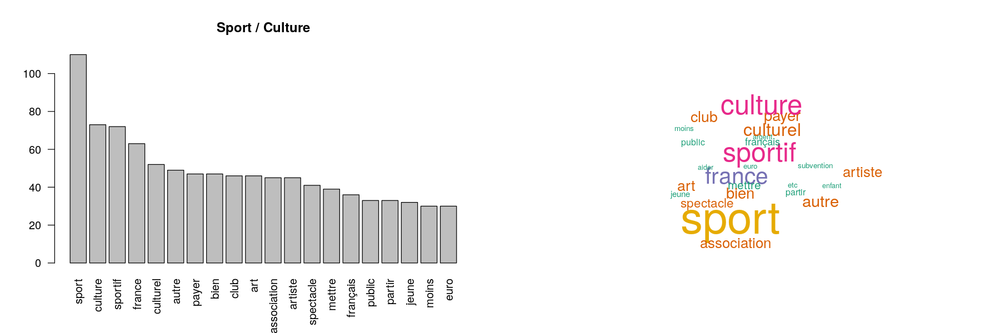

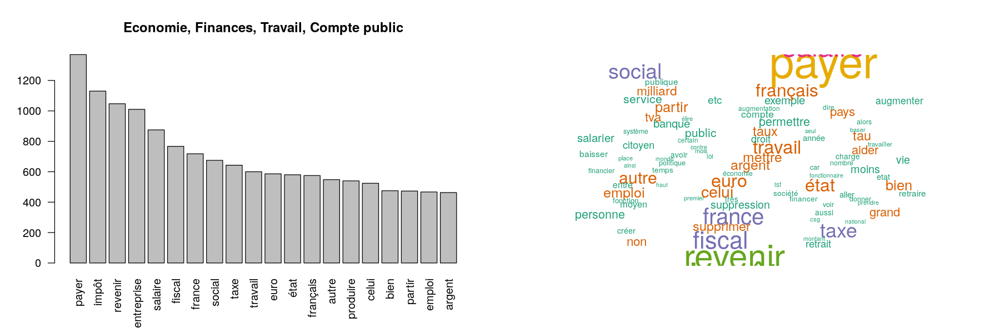

Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“celui could not be fit on page. It will not be plotted.”Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“politique could not be fit on page. It will not be plotted.”Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“revenir could not be fit on page. It will not be plotted.”Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“prendre could not be fit on page. It will not be plotted.”Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“entreprise could not be fit on page. It will not be plotted.”Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“france could not be fit on page. It will not be plotted.”Warning message in wordcloud(words = names(mmots), freq = mmots, colors = brewer.pal(6, :
“mettre could 

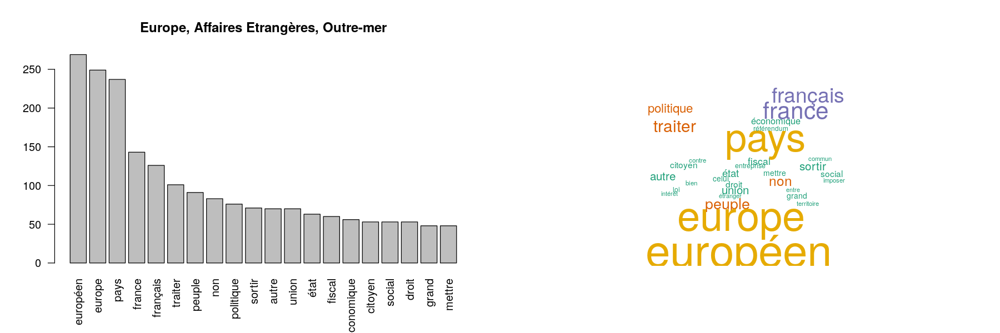

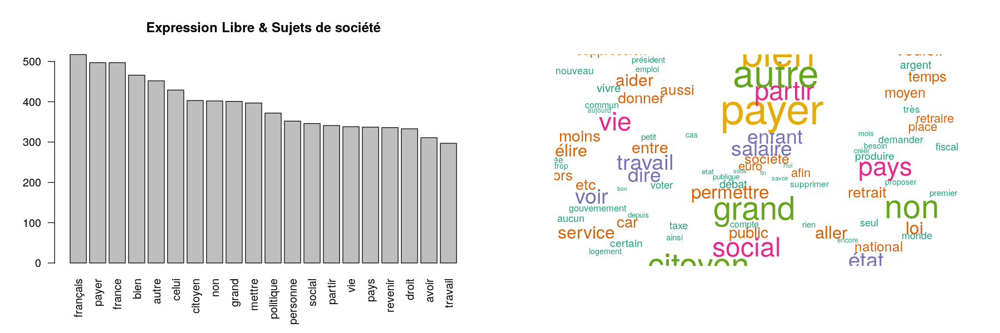

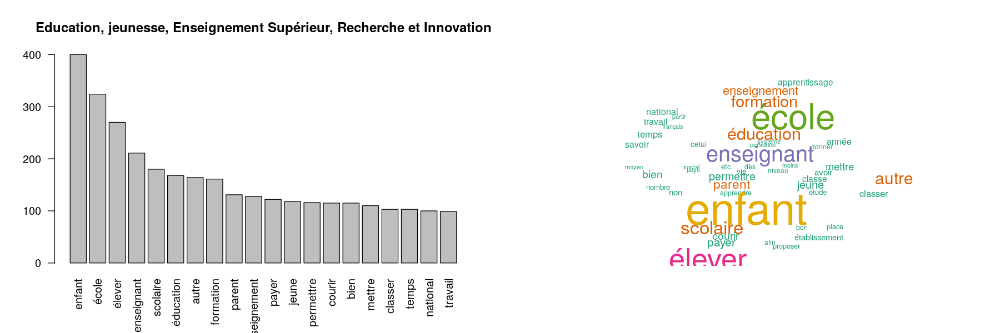

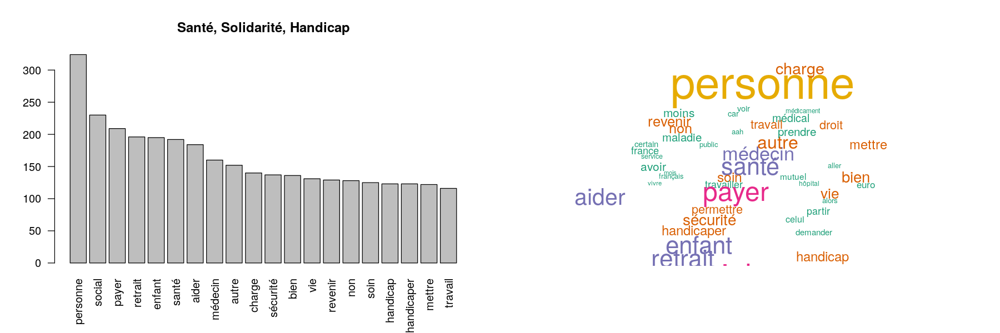

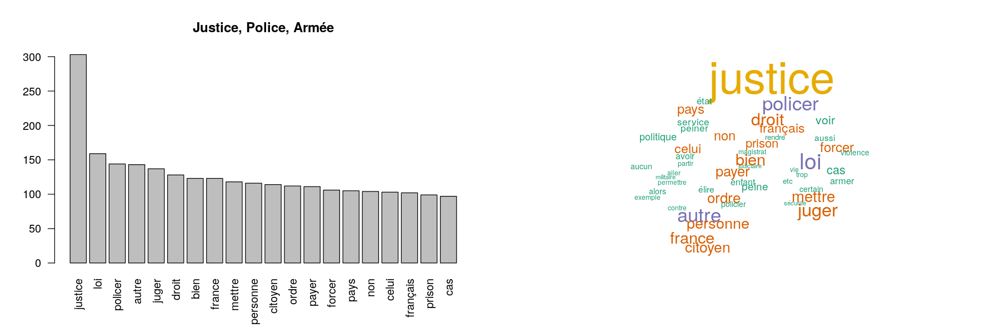

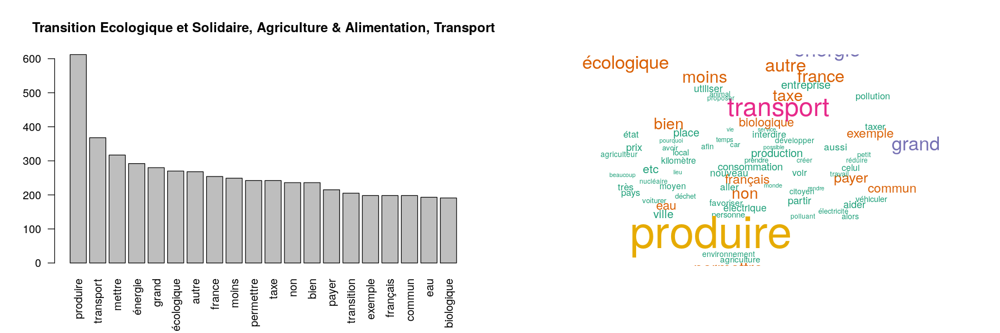

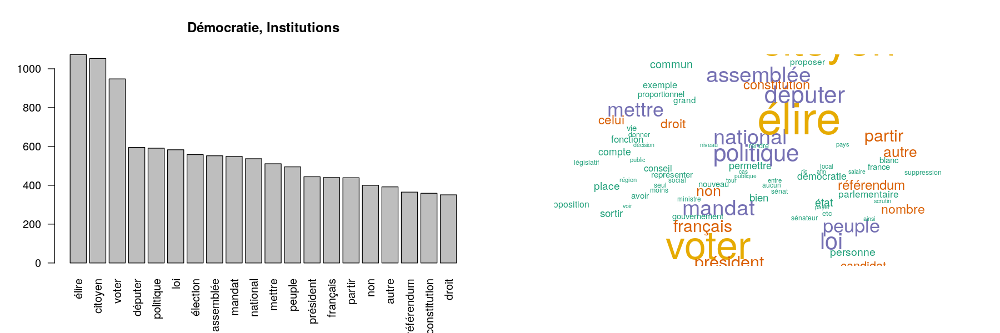

In [49]:
library(wordcloud)
for(otype in optype$V2){
    dmin=stops_noinc[((1:nrow(d))[d$optype==otype])]
    dtm=TermDocumentMatrix(dmin)
    m=as.matrix(dtm)
    mots=rowSums(m)
    par(mfrow=c(1,2))
    barplot(head(mots[order(mots, decreasing=T)], 20), las=2, main=otype)
    mmots=mots[mots>quantile(mots, 0.99)]
mmots=mmots-quantile(mots, 0.99)+1
wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), fixed.asp=F, rot.per=0)
}

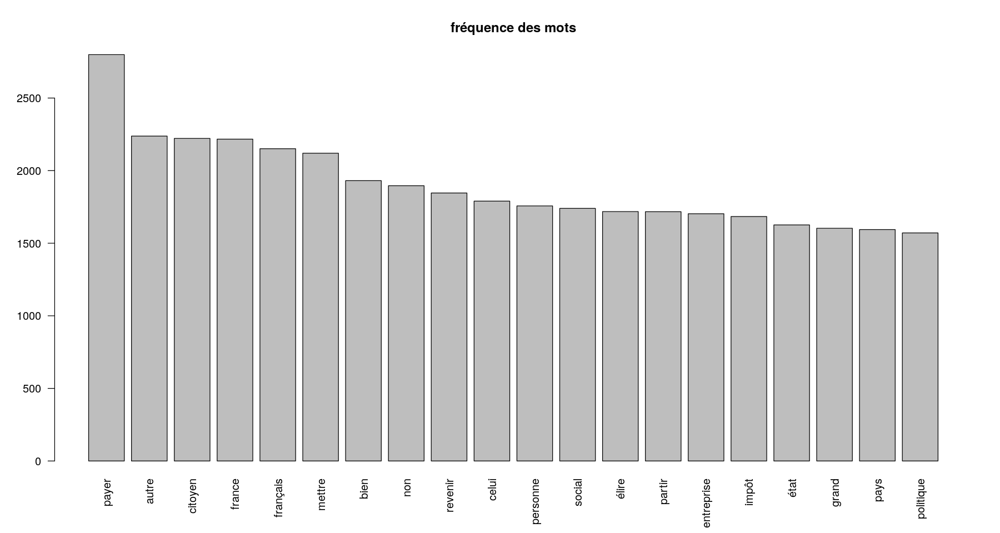

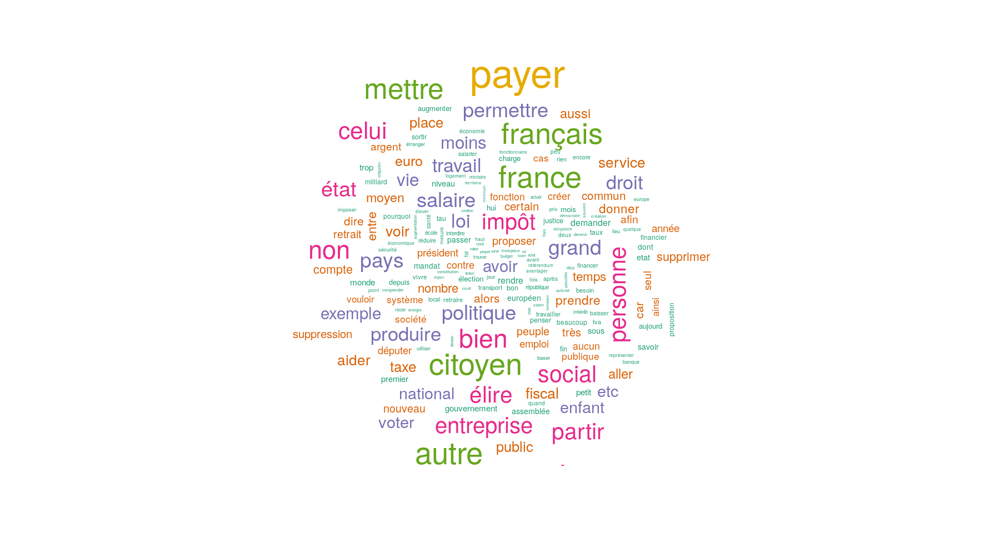

In [72]:
dmin=stops_noinc
par(mfrow=c(1,1))
options(repr.plot.width=15, repr.plot.height=8)
dtm=TermDocumentMatrix(dmin)
    m=as.matrix(dtm)
    mots=rowSums(m)
    barplot(head(mots[order(mots, decreasing=T)], 20), las=2, main="fréquence des mots")
    mmots=mots[mots>quantile(mots, 0.99)]
mmots=mmots-quantile(mots, 0.99)+1
#wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), fixed.asp=F, rot.per=0)
wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), scale=c(3.5, 0.3))


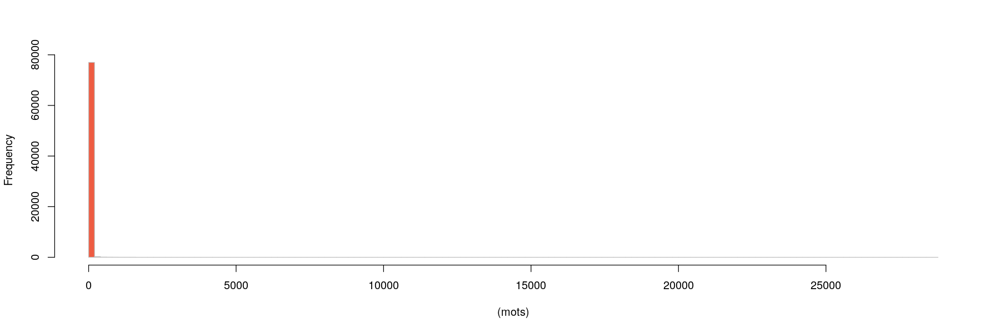

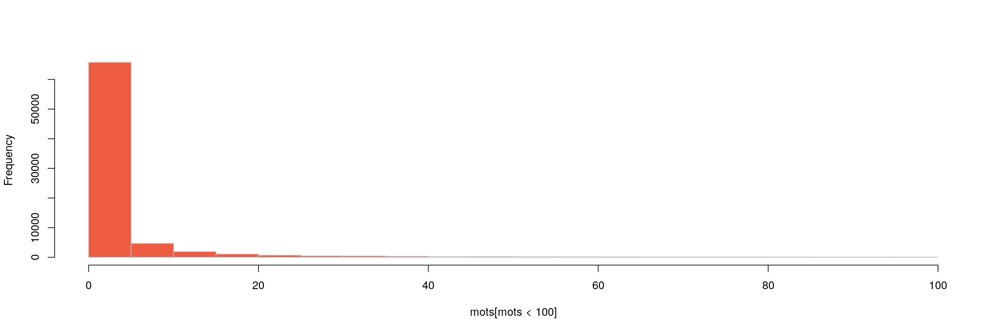

In [67]:
dmin=docs_untrans
dtm=TermDocumentMatrix(dmin)
    m=as.matrix(dtm)
    mots=rowSums(m)
#    barplot(head(mots[order(mots, decreasing=T)], 20), las=2, main=otype)
    mmots=mots[mots>quantile(mots, 0.99)]
mmots=mmots-quantile(mots, 0.99)+1
#wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), fixed.asp=F, rot.per=0)

hist((mots), main="", col="tomato2", border="gray", breaks=200)
hist(mots[mots<100], main="", col="tomato2", border="gray")


In [68]:
head(dmin$content)

[1] "   Constitutionnaliser la règle verte  : ne pas prélever sur la nature davantage que ce qu'elle peut reconstituer, ni produire plus que ce qu'elle peut supporter.   Protéger les biens communs : l'air, l'eau, l'alimentation, le vivant, la santé, l'énergie, la monnaie ne sont pas des marchandises. Ils doivent être gérés démocratiquement  : le droit de propriété doit être soumis à l'intérêt général, la propriété commune protégée et les services publics développés.   Constitutionnaliser et rendre effectifs les droits au travail et au logement.   Amnistier les syndicalistes et militants associatifs condamnés pour faits de luttes sociales, écologiques ou pour la défense des libertés,  protéger les lanceurs d'alerte et investir les salariés d'une mission d'alerte sociale et environnementale.   "
[2] " Suppression de l'impôt sur l'impôt comme payer de la tva sur des taxes électricité par exemple est surtout nous payons des impôts sur le revenus sans pouvoir déduire l'impôt payé l'année antérieure. C'est du racket.  "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
[3] " Mise en place du RIC "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        
[4] " Nous avons tout un réseau de voies navigables dont nous ne tirons pas profit. "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               
[5] " Changer le mode de scrutin au moins pour l'élection présidentielle pour passer au jugement majoritaire, qui permettrait d'offrir bien plus de légitimité au candidat élu.   Car le scrutin majoritaire à un ou deux tours mesure mal les opinions. Il force l’électeur à voter pour un seul candidat alors qu'il a des opinions sur tous les candidats. Un électeur pourrait vouloir soutenir plusieurs candidats, apprécier peu le candidat pour qui il a voté, voter utile, voter pour, ou voter contre. Néanmoins, chaque vote est comptabilisé comme une adhésion et vaut 1 ce aui peut induire le scrutin majoritaire à de graves erreurs (même avec seulement 2 candidats).  "                                                                                                                  

## Ajout des titres des revendications

In [6]:
library(data.table)
library(tm)
library(stringi)
library(textstem)
library(koRpus.lang.fr)
library(wordcloud)
library(text2vec)
library(gsubfn)
library(dendextend)


Loading required package: NLP
Loading required package: koRpus.lang.en
Loading required package: koRpus
Loading required package: sylly
For information on available language packages for 'koRpus', run

  available.koRpus.lang()

and see ?install.koRpus.lang()

Loading required package: RColorBrewer
Loading required package: proto
Warning message:
“no DISPLAY variable so Tk is not available”
---------------------
Welcome to dendextend version 1.9.0
Type citation('dendextend') for how to cite the package.

Type browseVignettes(package = 'dendextend') for the package vignette.
The github page is: https://github.com/talgalili/dendextend/

Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues
Or contact: <tal.galili@gmail.com>

	To suppress this message use:  suppressPackageStartupMessages(library(dendextend))
---------------------


Attaching package: ‘dendextend’

The following object is masked from ‘package:data.table’:

    set

The following ob

In [7]:
d=fread("opinion.csv")

hd=fread("header", header=F)$V1
colnames(d)=hd
optype=fread("opinion_type.csv", header=F)
d$optype=optype$V2[match(as.character(d$opinion_type), optype$V1)]
e=fread("opinion_titre_noquote.csv", header=F, quote="", sep="\t")
text=paste(e$V1, d$body)


In [8]:
removeLinks = function(string){
  return(gsub(" ?(f|ht)(tp)(s?)(://)(.*)[.|/](.*)", " ", string))  
}

removeChars <- function(htmlString) {
  return(gsub("&.*?;", " ", htmlString))
}


cleanFun <- function(htmlString) {
  return(gsub("<.*?>", " ", htmlString))
    
}



gj=Corpus(VectorSource(text))
docs=gj;
#docs <- tm_map(docs, content_transformer(tolower))
docs=tm_map(docs, cleanFun)
docs=tm_map(docs, removeLinks)
docs=tm_map(docs, removeChars)
docs_untrans=docs
#docs <- tm_map(docs, removeNumbers)
docs=tm_map(docs, removeWords, stopwords("french"))
replacePunctuation <- content_transformer(function(x) {return (gsub("[[:punct:]]"," ", x))})

docs=tm_map(docs, replacePunctuation)
docs=tm_map(docs, stripWhitespace)

Warning message in tm_map.SimpleCorpus(docs, cleanFun):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeLinks):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeChars):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, replacePunctuation):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”

In [9]:
selfcorr = c("sécurité", "sécurité", "", "", "économie", "économie", "kilomètre", "milliard", "agroalimentaire", "dioxyde", "")
names(selfcorr)=c("sécu", "secu", "ème", "eme", "éco", "eco", "km", "mds", "agro", "co2", "ni")
selfcordict=split(unname(selfcorr),names(selfcorr))


In [10]:
replace_words=function(string, dict, i=length(dict)){
    if(i==1){return(gsub(paste0('\\b', names(dict)[1], '\\b'), dict[1], string))}
    else{return(gsub(paste0('\\b', names(dict)[i], '\\b'), dict[names(dict)[i]], replace_words(string, dict, i-1)))}    
}
replace_words_nothing=function(string, dict, i=length(dict)){
    if(i==1){return(gsub(paste0('\\b', dict[1], '\\b'), " ", string))}
    else{return(gsub(paste0('\\b', dict[1], '\\b'), " ", replace_words(string, dict, i-1)))}    
}


correction =function (x){
for (wd in setdiff(unlist(hunspell(x, dict="fr")), motsaufs)){
  x=gsub(paste0('\\b', wd, '\\b'), unlist(hunspell_suggest(wd, dict="fr"))[1] ,x)  
}
}
correct_text =function (content){paste(sapply(strsplit(tolower(content), " ", fixed=T)[[1]], correction), collapse=' ')}
corrected=tm_map(docs, tolower)
corrected=tm_map(corrected, replace_words, selfcorr)
corrected <- tm_map(corrected, removeNumbers)
docs=tm_map(docs, stripWhitespace)


Warning message in tm_map.SimpleCorpus(docs, tolower):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(corrected, replace_words, selfcorr):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(corrected, removeNumbers):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”

In [11]:

lemdict=make_lemma_dictionary(corrected, engine="treetagger", lang="fr", path="/mnt/k/Downloads/vraidebat")

doclem=tm_map(corrected, lemmatize_strings, dictionary=lemdict)


Warning message in tm_map.SimpleCorpus(corrected, lemmatize_strings, dictionary = lemdict):
“transformation drops documents”

In [12]:
stops=tm_map(doclem, removeWords, stopwords("french"))

mul=sapply(stops, function(x){grepl("\\|", x)})
wds=sapply(stops, function(x){grep('|', strsplit(x, " +")[[1]], fixed=T, value=T)})
removeLemmas=function(x){
    return(paste(strsplit(x, '|', fixed=T)[[1]], collapse=" "))
}
stops_noinc=stops
stops_noinc$content=sapply(stops, removeLemmas)

removeSmall= function(str){
    gsub('\\b\\w{1,2}\\s','',str)
}

stops_noinc$content=sapply(stops_noinc, removeSmall)
redondant=c("plus", "tout", "faire", "falloir", "devoir", "pouvoir", "être", "donc", "comme",
            "chaque","non", "autre" , "bien", "celui", "grand", "mettre")
stops_noinc=tm_map(stops_noinc, removeWords, redondant)

Warning message in tm_map.SimpleCorpus(doclem, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(stops_noinc, removeWords, redondant):
“transformation drops documents”

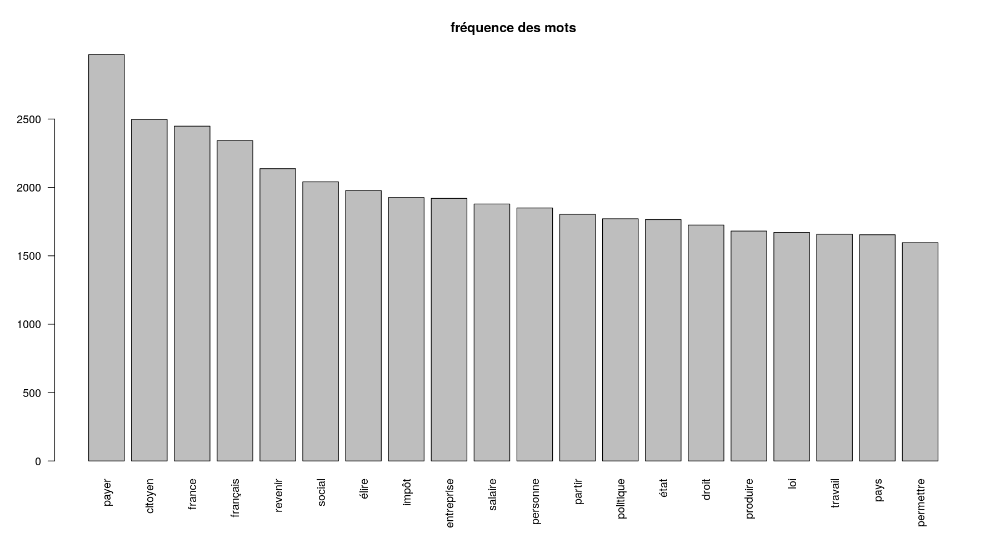

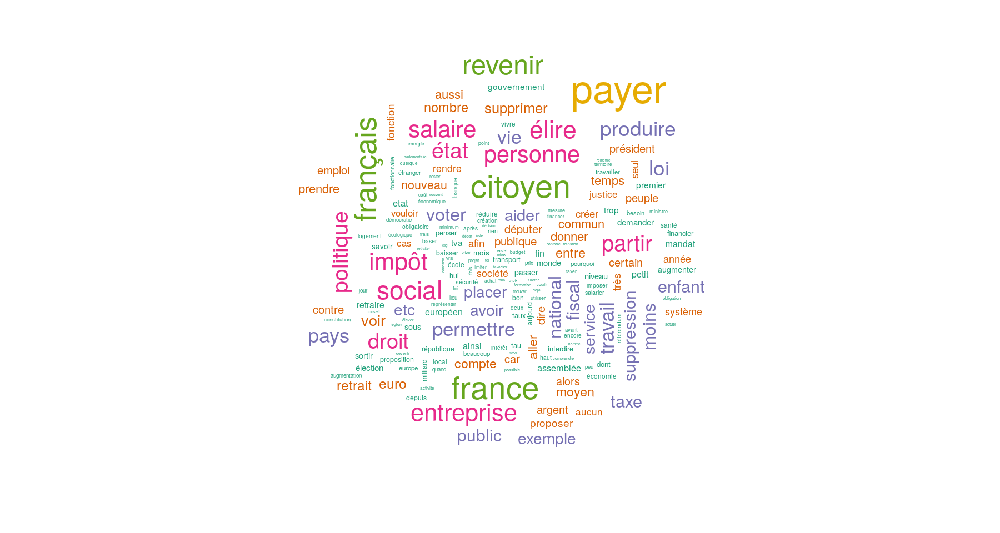

In [11]:
dmin=stops_noinc
par(mfrow=c(1,1))
options(repr.plot.width=15, repr.plot.height=8)
dtm=TermDocumentMatrix(dmin)
    m=as.matrix(dtm)
    mots=rowSums(m)
    longueur=colSums(m)
    barplot(head(mots[order(mots, decreasing=T)], 20), las=2, main="fréquence des mots")
    mmots=mots[mots>quantile(mots, 0.99)]
mmots=mmots-quantile(mots, 0.99)+1
#wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), fixed.asp=F, rot.per=0)
wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), scale=c(3.5, 0.3))


## Incorporation du vote

In [12]:
d$n_vote=d$vote_count_nok+d$vote_count_ok+d$vote_count_mitige

In [13]:
head(d$n_vote)

[1]  2  9 22  5 10  2

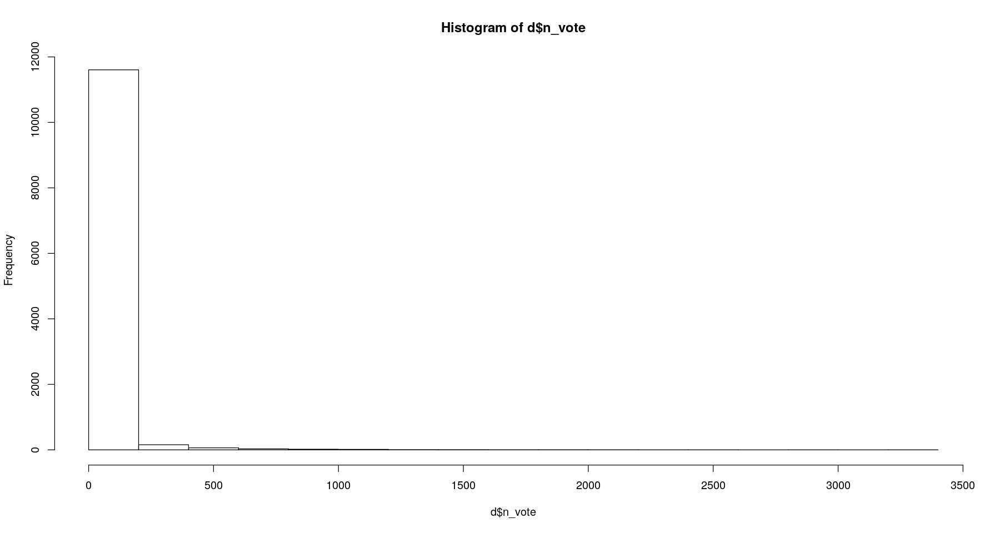

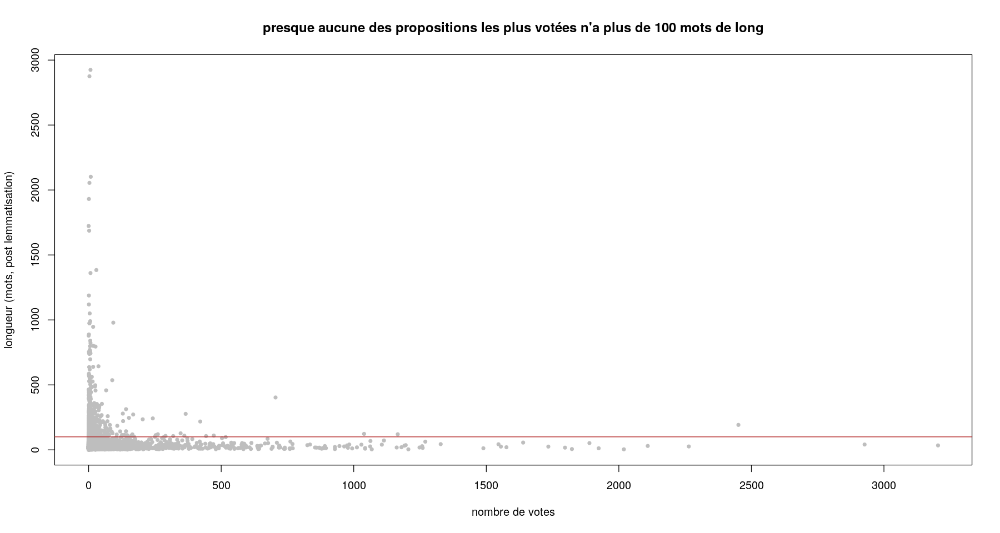

In [14]:
hist(d$n_vote)
plot(d$n_vote, longueur, ylab="longueur (mots, post lemmatisation)", xlab="nombre de votes",
     main="presque aucune des propositions les plus votées n'a plus de 100 mots de long", pch=20, col="gray")
abline(h=100, col="firebrick")

## Matrice de mots et nuage pondéré par le vote

In [15]:
tm=apply(m, 1, function(x) x*d$n_vote)
dim(tm)

[1] 11909 20741

In [16]:
tm=t(tm)

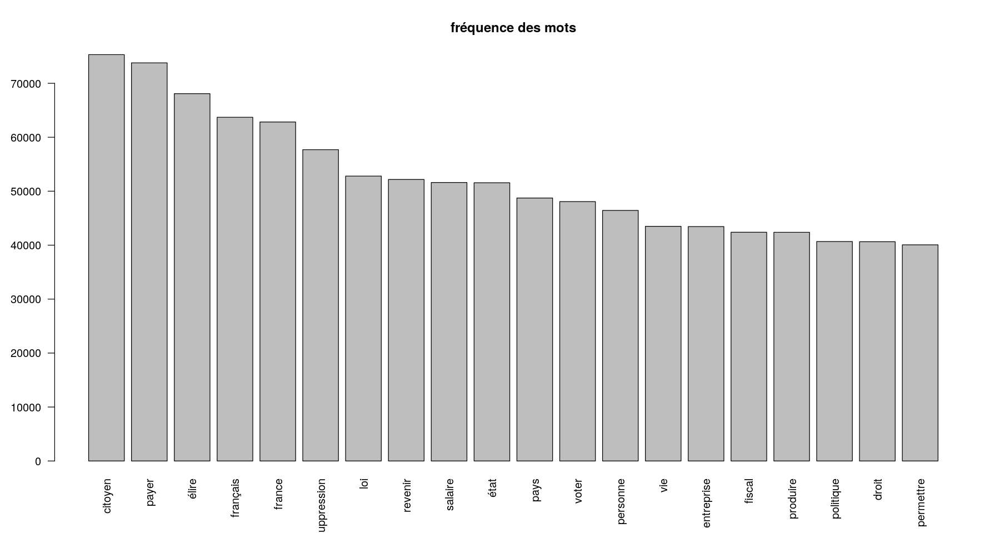

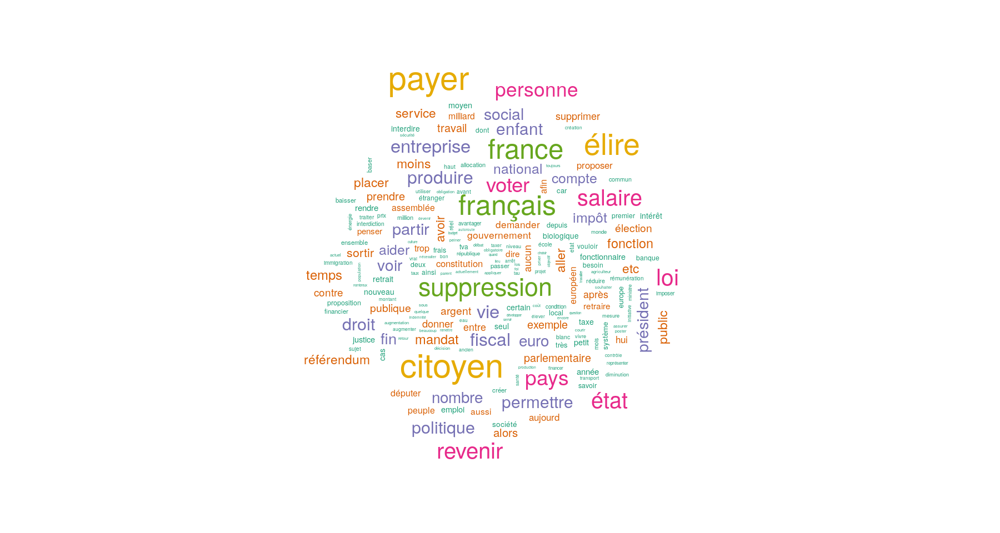

In [17]:
    mots=rowSums(tm)
    longueur=colSums(tm)
    barplot(head(mots[order(mots, decreasing=T)], 20), las=2, main="fréquence des mots")
    mmots=mots[mots>quantile(mots, 0.99)]
mmots=mmots-quantile(mots, 0.99)+1
#wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), fixed.asp=F, rot.per=0)
wordcloud(words=names(mmots), freq=mmots, colors=brewer.pal(6, "Dark2"), scale=c(3, 0.3))

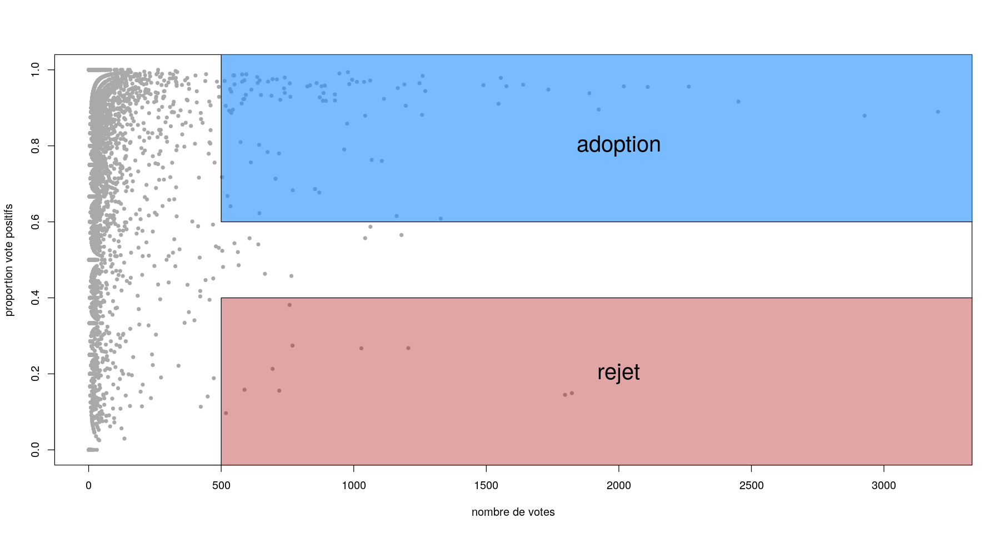

In [18]:
d$vote=d$vote_count_ok/d$n_vote
plot(d$n_vote, d$vote, ylab="proportion vote positifs", xlab="nombre de votes", pch=20, col="darkgray")
rect(xleft=500, xright=4000, col=adjustcolor("firebrick", alpha=0.4), ybottom=-1, ytop=0.4)
rect(xleft=500, xright=4000, col=adjustcolor("dodgerblue", alpha=0.6), ybottom=0.6, ytop=2)
text("rejet", x=2000, y=0.2, cex=2)
text("adoption", x=2000, y=0.8, cex=2)

In [19]:
adoption=d[d$n_vote>500 & d$vote>0.6, c("vote","n_vote","vote_count_ok", "vote_count_nok", "vote_count_mitige", "optype","title", "body")]
nrow(adoption)
adoption[order(adoption$n_vote, decreasing=T),]

[1] 93

vote      n_vote vote_count_ok vote_count_nok vote_count_mitige
1  0.8895131 3204   2850          199            155              
2  0.8793987 2927   2574          125            228              
3  0.9163607 2451   2246           71            134              
4  0.9558304 2264   2164           68             32              
5  0.9549550 2109   2014           35             60              
6  0.9564141 2019   1931           50             38              
7  0.8955301 1924   1723          153             48              
8  0.9385918 1889   1773           46             70              
9  0.9480969 1734   1644           46             44              
10 0.9609518 1639   1575           30             34              
11 0.9568528 1576   1508           20             48              
12 0.9787781 1555   1522            8             25              
13 0.9107374 1546   1408          103             35              
14 0.9597045 1489   1429           37             23              
15 0.6084337 1328    808          456             64              
16 0.9440945 1270   1199           51             20              
17 0.9841270 1260   1240            8             12              
18 0.8815580 1258   1109          108             41              
19 0.9647436 1248   1204           24             20              
20 0.9055184 1196   1083           49             64              
21 0.9613770 1191   1145           25             21              
22 0.9519726 1166   1110           35             21              
23 0.6153184 1162    715          375             72              
24 0.9236984 1114   1029           29             56              
25 0.7603978 1106    841          193             72              
26 0.7631086 1068    815          159             94              
27 0.9717514 1062   1032           14             16              
28 0.8791946 1043    917           63             63              
29 0.9682387 1039   1006           14             19              
30 0.9683794 1012    980            9             23              
⋮  ⋮         ⋮      ⋮             ⋮              ⋮                
64 0.9338462 650    607            34              9              
65 0.9720930 645    627            10              8              
66 0.6226708 644    401           136            107              
67 0.8024883 643    516           103             24              
68 0.9655172 638    616             4             18              
69 0.9811321 636    624             3              9              
70 0.9478827 614    582            16             16              
71 0.7565359 612    463            91             58              
72 0.9882353 595    588             3              4              
73 0.9342327 593    554            26             13              
74 0.9727891 588    572             8              8              
75 0.9233390 587    542            19             26              
76 0.9229452 584    539            24             21              
77 0.9879102 579    572             4              3              
78 0.9689119 579    561            12              6              
79 0.9116118 577    526            36             15              
80 0.8097731 573    464            88             21              
81 0.9618182 550    529             8             13              
82 0.9854281 549    541             6              2              
83 0.9853480 546    538             3              5              
84 0.8952206 544    487            34             23              
85 0.8866171 538    477            43             18              
86 0.9423792 538    507            17             14              
87 0.6411215 535    343           178             14              
88 0.9493433 533    506            14             13              
89 0.8924528 530    473            20             37              
90 0.6679389 524    350           145             29              
91 0.9052224 517    468            27             

<div class="alert alert-success">Les propositions soutenues par le plus grand nombre sont:
<li> mise en place du RIC
<li> prise en compte du vote blanc
<li> réduction du train de vie des élus et arrêt de la rémunération à vie
<li> nationaliser les autoroutes amorties
<li> etc...
</div>

In [17]:
d[d$n_vote>500 & d$vote<0.4, c("vote","vote_count_ok", "vote_count_nok", "vote_count_mitige", "optype","title", "body")]

vote,vote_count_ok,vote_count_nok,vote_count_mitige,optype,title,body
0.2743823,211,460,98,"Education, jeunesse, Enseignement Supérieur, Recherche et Innovation",Diminuer les vacances scolaires,"<p>Les vacances scolaires sont trop longues.</p><p>Corollaire : Les instituteurs et professeurs ne travaillent pas assez.</p><p>Les diminuer et ne faire travailler les élèves que le matin, en proposant d'autres types d'activités l'après-midi (découvertes des métiers, pop philosophie, sport...)</p><p>Nota : La France est l'un des pays de l'OCDE ayant : les plus longues vacances, le plus d'heures de cours pas semaine,</p><p>et pourtant...les plus faibles résultats, notamment dans les matières scientifiques. (Voir Evaluer les professeurs des écoles).</p>"
0.1557719,112,570,37,"Démocratie, Institutions",La fausse bonne idée du RIC,"<p>Je suis absolument opposé à la mise en place du référendum d'initiative citoyenne. Quelle compétence a le citoyen pour résoudre des problèmes de société toujours plus complexes ?! Le peuple n'a pas toujours raison et il est tellement versatile que le pays deviendrait ingérable avec ce dispositif. Puis au passage, Hitler a accédé au pouvoir grâce au référendum... ça fait réfléchir...</p><p><br /></p>"
0.1492046,272,1439,112,"Justice, Police, Armée",réinstauration de la peine de mort,<p>Ré instauration de la peine de mort.</p>
0.3812665,289,353,116,"Justice, Police, Armée",Service militaire,"<p>Retour à un vrai service militaire, 1 an , calé sur les années scolaires (de septembre a septembre).</p>"
0.2132565,148,483,63,Sport / Culture,suppression de nombreuses associations.,<p>Il n'y a qu'à voir et contrôler le nombre d'associations sur certaines villes notamment du 93 pour s'aperçevoir rapidement qu'elles sont trop nombreuses (parfois plus de 67 sur certaines villes) et coûtent une fortune aux contribuables. Donc taille importantes des associations dans tous les domaines.</p>
0.1446856,260,1499,38,Expression Libre & Sujets de société,Suppression de la loi autorisant le mariage homosexuel,<p>La loi autorisant le mariage homosexuel a été voté en 2012 alors que plus d'un million de personnes étaient dans les rues pour s'y opposer. Le peuple n'a pas été consulté.</p>
0.1581633,93,471,24,Sport / Culture,Privatisation de France Télévision et de Radio France,"<p>Suppression de la redevance audiovisuelle et privatisation de l'appareil de communication de l'état. Beaucoup hurlent sans cesse à la manipulation ou aux fakes, tantôt de la part de l'état, tantôt de la part des médias privés. Moi, tout ce que je vois, c'est que je me déleste de 139 euros par an sans savoir si cela m'informe mieux ou si cela participe à une forme de propagande. </p>"
0.2672498,275,677,77,"Education, jeunesse, Enseignement Supérieur, Recherche et Innovation",Ne plus verser d'allocations familiales au-delà du deuxième enfant,"<p>En effet, nous sommes déjà largement assez sur Terre, inutile d'encourager l'augmentation de la natalité.</p><p>Sans compter ce que coûte au niveau environnemental un enfant des pays développés...</p><p>De plus, l'éducation des enfants est forcément moins bonne quand on en a davantage (le temps et l'argent ne sont pas extensibles à volonté...).</p><p>Si les parents veulent une famille nombreuse, c'est comme pour une piscine : ils la financent avec leur argent, pas avec celui des autres...</p><p><br /></p>"
0.2678275,323,769,114,"Transition Ecologique et Solidaire, Agriculture & Alimentation, Transport",MAINTIEN DU NUCLEAIRE,<p>MAINTIEN DU NUCLEAIRE</p>
0.0965251,50,457,11,"Santé, Solidarité, Handicap",Libérez nous de la Sécu,"<p><strong style=\""background-color:transparent;\"">Autoriser les assurés qui le désirent à quitter la Sécurité Sociale en donnant la possibilité à des Mutuelles y compris étrangères, de couvrir l'intégralité du risque maladie.</strong></p>"


<div class="alert alert-success">Les deux propositions les plus <strong>unanimement rejetées</strong> sont la <u>réinstauration de la peine de mort</u> et la <u>suppression du mariage homosexuel</u>. La privatisation des médias publics, le maintien du nucléaire, le retour du service militaire, la diminution du nombre d'associations, la suppression des allocations familiales pour les familles nombreuses, et d'autres propositions traditionnellement "libertaires" ou "conservatrices" sont également vues défavorablement.</div>

<div class="alert alert-warning">Pour harmoniser les sujets il va falloir faire une analyse de sentiment. E.g. "privatisation". Il faut savoir si l'OP est pour ou contre pour agréger les votes avec d'autres posts sur le sujet.</div>

## Clusterisation des textes

### tous les textes, un grand thème

On cherche tous les textes contenant "peine de mort".

In [20]:
mort=grepl("peiner mort", stops_noinc$content, fixed=T)

[1] 31

066cd370-24d6-11e9-995f-0242ac110003,"Démocratie, Institutions","Référendum d'initiative citoyenne RESPONSABLE Le citoyen ne doit plus être fataliste et se dire que que quoi qu'il vote, cela ne changera rien. Il doit avoir le sentiment qu'il peut apporter sa voix à un projet, marquer son désaccord ou son appui. Référendum d'initiative citoyenne Responsable (1) avec quorum à définir selon les 4 types : Constituant : Changement de la constitution Abrogatoire : Suppression ou modification d'une loi existante Révocatoire : Révocation d'un ou de responsable(s) politique(s) Législatif : Proposition de loi Concrètement un projet de loi serait travaillé par le sénat qui devrait veiller à son équilibre, sa faisabilité, sa rédaction. Pour qu'un projet de loi soit adopté, il faudrait l'approbation du sénat, de l'assemblée nationale ET du référendum d'initiative citoyenne. Pour que tout acte d'initiative citoyenne soit reconnu comme valable, il faudrait instaurer un nombre minimum de citoyens participants (sinon on tomberait dans une autre dérive : une loi pourrait être votée avec l'accord de quelques personnes et provoquer la grogne et donc sa suppression par un autre groupe réfractaire à la loi). Je propose 1% soit 455.000 personnes. En cas de participation citoyenne insuffisante, seuls les accords de l'assemblée nationale et du sénat suffiraient. Si les Français veulent participer au pouvoir à eux de se mobiliser. En cas de succès citoyen, l'assemblée nationale et le sénat pourraient être fusionnées après dégraissage des effectifs (Cfr 22).Le taux de participation pour qu'une décision du Ric soit validée peut être variable selon le degré de sensibilité du sujet : degré 1 (sujets dérisoires comme les rodéos motorisés : 0,5% de citoyens / degré 2 (sujets d'intérêts publics comme le 80 km/h sur les routes secondaires) 1,5 % / degré 3 : sujets plus délicats : 3% (plutôt sociétaires : avortement, euthanasie par ex) ; sujets très délicats/sensibles ( avec implications économiques : impôts ou tva par ex) / Degré 4 : sujets cruciaux : 10% (révocation du pouvoir politique à par le président ou d'une partie du pouvoir en place) / Degré 5 : Affaires d'Etat ultra sensibles 50% (Révocation du Président, Peine de Mort,Europe, etc).",référendum initiative citoyen responsable citoyen fataliste dire quoi voter changer rien avoir sentiment apporter voix projet marquer désaccord appui référendum initiative citoyen responsable quorum définir selon type constituer changement constitution abrogatoire suppression modification loi existant révocatoire révocation responsable politique législatif proposition loi concrètement projet loi travailler sénat veiller équilibrer faisabilité rédaction projet loi adopter approbation sénat assemblée national référendum initiative citoyen acter initiative citoyen reconnaître valable instaurer nombre minimum citoyen participant sinon tomber dériver loi voter accord quelque personne provoquer grogne suppression groupe réfractaire loi proposer personne cas participation citoyen insuffisant seul accord assemblée national sénat suffire français vouloir participer mobiliser cas succès citoyen assemblée national sénat fusionner après dégraissage effectif cfr tau taux participation décision ric valider variable selon degré sensibilité sujet degré sujet dérisoire rodéo motoriser citoyen degré sujet intérêt public kilométrer route secondaire degré sujet délicat plutôt sociétaire avortement euthanasie sujet très délicat sensible implication économique impôt tva degré sujet crucial révocation politique président partir placer degré affairer etat ultra sensible révocation président peiner mort europe etc
0a04fb53-24a8-11e9-995f-0242ac110003,"Démocratie, Institutions","Révision de la Constitution : inscrire dans le marbre les droit fondamentaux des citoyens et nos bien communs -Faire entrer dans la constitution les droit fondamentaux : Abolition de la peine de mort, droit à l’avortement, droit à la contraception, Mariage pour tous, Loi 

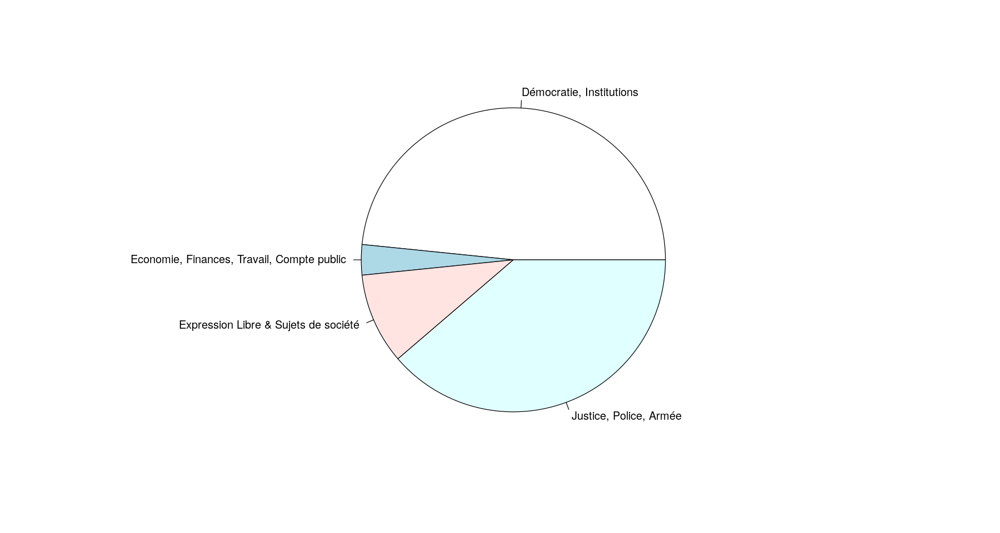

In [21]:
mortexte=(cbind(d$id[mort], d$optype[mort], docs_untrans$content[mort], stops_noinc$content[mort]))
nrow(mortexte)
pie(table(d$optype[mort]))
head(mortexte)

On se focalise sur Justice, Police, Armée, vu que les propositions promouvant la peine de mort sont là.

In [22]:
tfidf=DocumentTermMatrix(stops_noinc[d$optype=="Justice, Police, Armée"], control = list(weighting = weightTfIdf))
tfidf_min=removeSparseTerms(tfidf, 0.99)
dim(tfidf)
dim(tfidf_min)

[1]  764 5236

[1] 764 756

In [23]:
sim=sim2(x=as.matrix(tfidf_min), method="cosine")

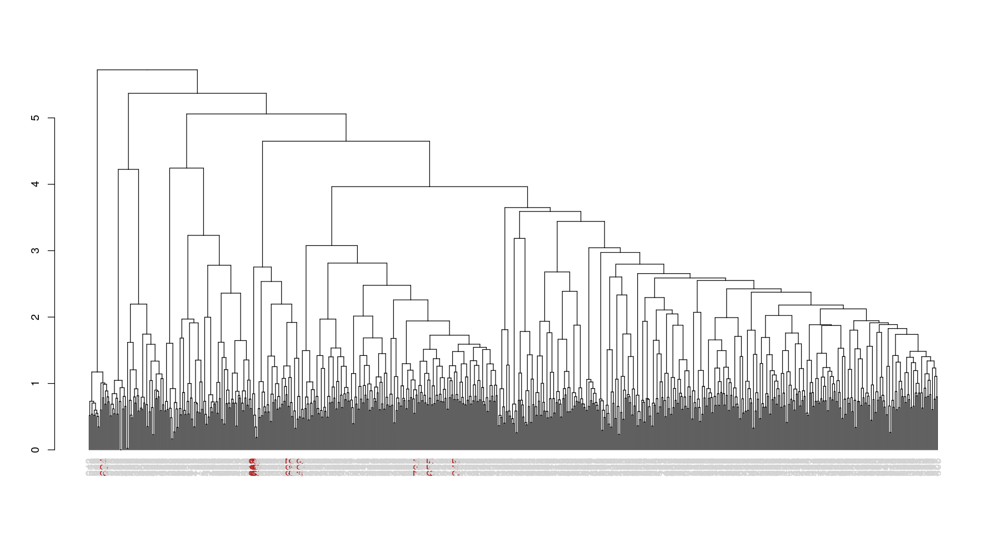

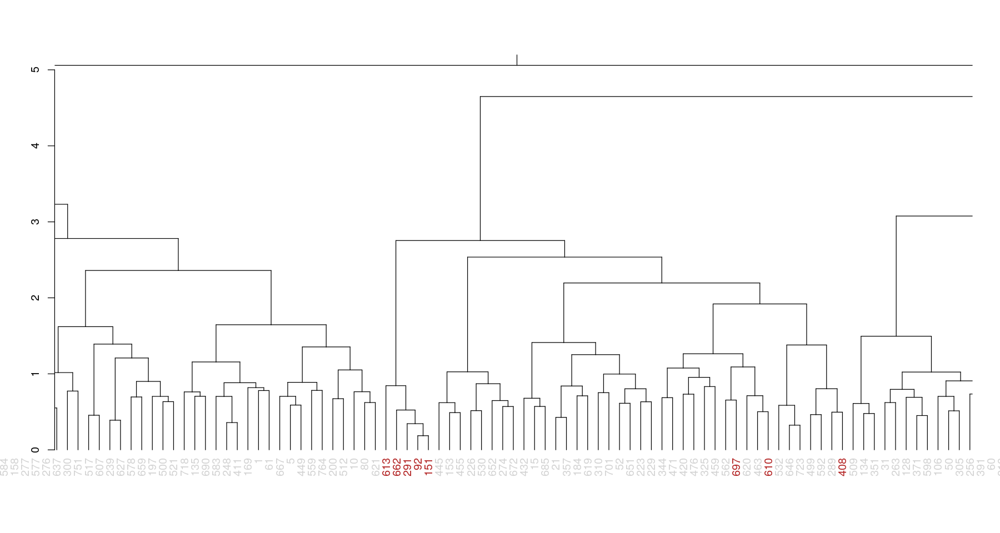

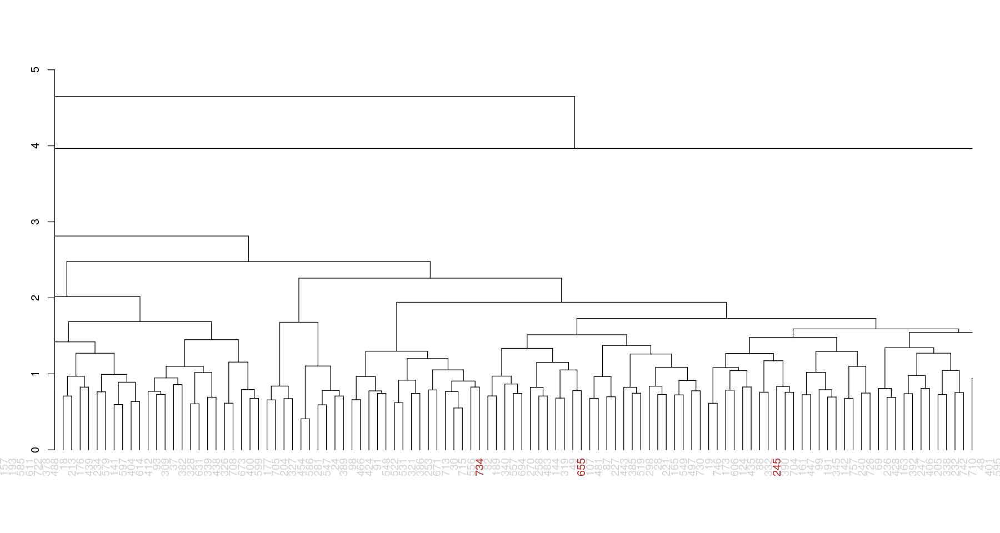

In [24]:
cdist=as.dist(1-sim)
hc <- hclust(cdist, "ward.D")
dend=as.dendrogram(hc)
colvect=rep("lightgray", nrow(sim))
mort=grepl("peiner mort", stops_noinc[d$optype=="Justice, Police, Armée"]$content, fixed=T)
colvect[mort]="firebrick"
colvect=colvect[order.dendrogram(dend)]
labels_colors(dend)=colvect
plot(dend)

#plot(color_labels(dend, k=3))
#clustering <- cutree(hc, 10)

#plot(hc, main = "Hierarchical clustering of 100 NIH grant abstracts",
#     ylab = "", xlab = "", yaxt = "n")

#rect.hclust(hc, 10, border = "red")
#dm=dend[cutree(dend, k=3)==3]

#labels_colors(dend)=colvect
plot(dend, ylim=c(0,5), xlim=c(120,200))
plot(dend, ylim=c(0,5), xlim=c(250,350))

In [23]:
jpad[c(697, 610,408), c("title","body", "n_vote", "vote")]

ERROR: Error in eval(expr, envir, enclos): object 'jpad' not found


In [ ]:
jpad[c(562, 620, 463), c("title","body", "n_vote", "vote")]

In [ ]:
jpad[c(532, 646,723), c("title","body", "n_vote", "vote")]

562 est le plus proche de 697 d'après le dendrogramme. 562 est pour le retour d'une "vraie" prison, tout comme 697. Mais 697 contient aussi un message anti-immigration et pro-peine de mort.

620 et 463 demandent une application plus stricte des peines sans aménagement. Tout comme 610, duquel ils sont proximaux.



In [ ]:
jpad[c(613, 662, 291,92,151), c("title","body", "n_vote", "vote")]

Le clustering hiérarchique fonctionne globalement bien: ici les propositions concernant principalement la peine de mort sont bien ensemble. Malheureusement il reste beaucoup de posts avec plusieurs idées qui seront toujours inclassifiables. Options:

* extraire les thèmes forts avec le word cloud et faire de l'information retrieval sur tous les sujets, suivi d'une agrégation;
* trouver un moyen de classifier les textes multiidées et les séparer.
  * un moyen possible: extraire les propositions courtes ou réduites au titre. Clusteriser et ensuite tenter de classifier les propositions longues. Les complexes devraient être proches des idées élémentaires qui composent son propos.

In [25]:
jpa=stops_noinc[d$optype=="Justice, Police, Armée"]
jpad=d[d$optype=="Justice, Police, Armée"]
mort=grepl("peiner mort", jpa$content, fixed=T)
length(jpad$id[mort])
head(cbind((1:length(jpa))[mort], jpad$id[mort], jpad$optype[mort], jpa$content[mort]))

[1] 12

92,1e70fba3-248c-11e9-995f-0242ac110003,"Justice, Police, Armée",réinstauration peiner mort instauration peiner mort
151,353b2c3c-25fb-11e9-b3c2-0242ac110002,"Justice, Police, Armée",peiner mort réinstauration peiner mort auteur attentat crime enfant
245,5256cfd6-2558-11e9-a71a-0242ac110003,"Justice, Police, Armée",rétablissement peiner mort peiner mort réappliquée criminel dont prouver récidiver ensuite particulièrement motiver obédience religieux réel usurper priser bonder tel point créer grever inutilement impôt abolition preuve meilleur dissuasion recul nécessaire juger définitivement récidiviste violent avertir premier foi fois foot carton jaune rouge ensuite quant récidiviste violent objet ban société possibilité revenir touriste impliquer naturellement surveillance drastique frontière sortir interdire
291,5dd64586-25fb-11e9-b3c2-0242ac110002,"Justice, Police, Armée",refus retour djihadistes peiner mort refus retour djihadistes peiner mort
408,87482351-2611-11e9-b3c2-0242ac110002,"Justice, Police, Armée",peiner réel vraiment peiner mort tueur violeur quand peiner perpétuité réellement perpétuité perpétuité individu condamner peiner réellement surtout personne tuer violer remettre peiner petit délinquant peiner travail général dès ère délinquance attendre voire avant condamner punir
610,ca8cb2ab-2722-11e9-be89-0242ac110003,"Justice, Police, Armée",prison vie criminel terroriste peiner mort prison perpétuité criminel terroriste fini peine perpétuité finir jour prison sinon retablissons peiner mort gens permettre suicider prison


In [ ]:
sim_mort=sim[(1:length(jpa))[mort],(1:length(jpa))[mort]]
sim_nomort=sim[-(1:length(jpa))[mort],-(1:length(jpa))[mort]]
boxplot(sim_mort[upper.tri(sim_mort)], sim_nomort[upper.tri(sim_nomort)])

<div class="alert alert-info"> Les posts parlant de la peine de mort sont bien plus similaires entre eux que la majorité des autres propositions...Peut-on les voir en utilisant de la MDS?</div>

## PCA

In [26]:
pca=princomp(sim)

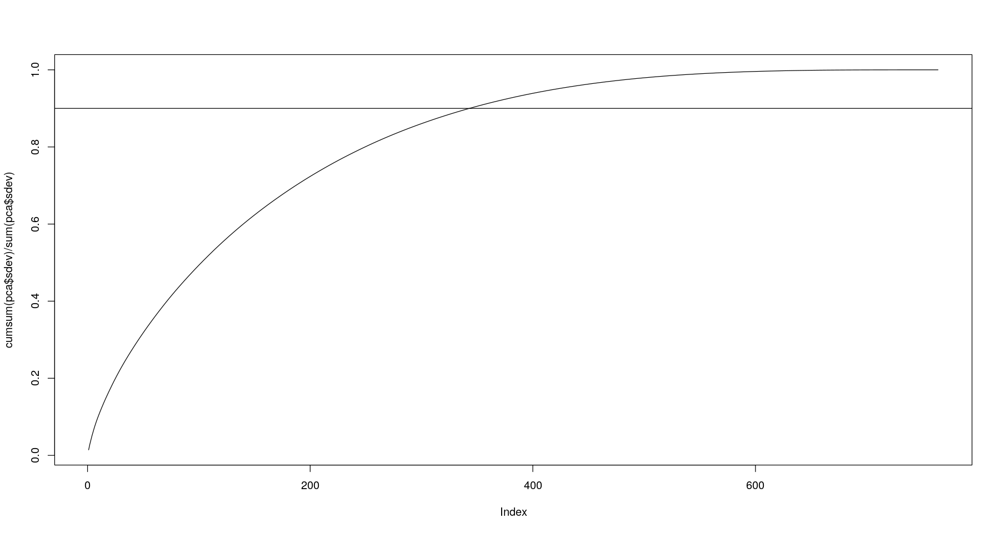

In [27]:
plot(cumsum(pca$sdev)/sum(pca$sdev), type="l")
abline(h=0.90)

Il faut tout de même plus de 300 propositions pour capturer 90% de la variance... ce qui montre les limites de notre représentation tf-idf. Essayons avec une limite différente:

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”

ERROR: Error in "0.99":"red": NA/NaN argument


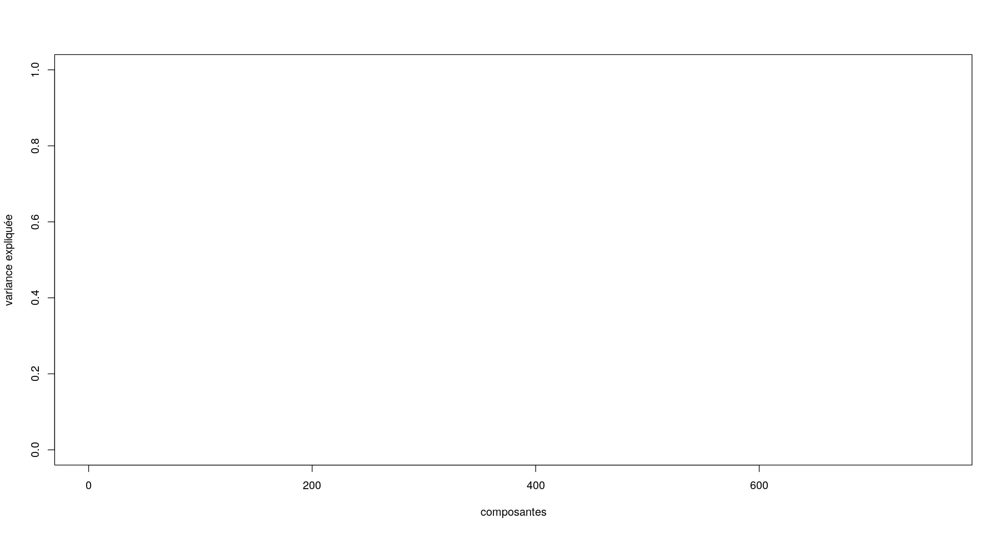

In [28]:
plot(0, type="n", xlim=c(0, 760), ylim=c(0,1), xlab="composantes",ylab="variance expliquée")
colist=list({"0.99":"red"})
for (prop in c(0.99, 0.995)){
     tfidf_minn=removeSparseTerms(tfidf, prop)
     #simm=sim2(x=as.matrix(tfidf_minn), method="cosine")
    simm=cor(t(as.matrix(tfidf_minn)))
     pca=princomp(simm)
     lines(cumsum(pca$sdev)/sum(pca$sdev), col=colist[as.character(prop)])
    }

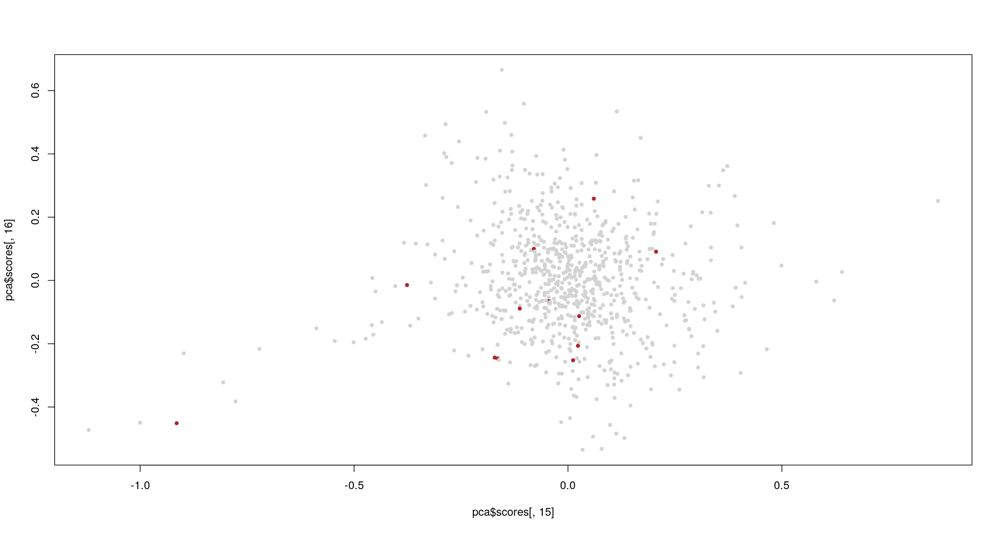

In [50]:
plot(pca$scores[,15], pca$scores[,16], col=colvect, pch=20)

In [32]:
length(colvect)

[1] 764

Pas très convaincant. On essaie LDA.

### Topic Modelling avec Latent Dirichlet Allocation

In [4]:
library("topicmodels")


Attaching package: ‘topicmodels’

The following object is masked from ‘package:text2vec’:

    perplexity



In [29]:
i_lda=DocumentTermMatrix(stops_noinc[d$optype=="Justice, Police, Armée"])

t_lda=LDA(i_lda, k=10)

In [30]:
terms(t_lda, 5)

Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
justice,cannabis,justice,justice,policer,militaire,loi,vitesse,trop,prison
magistrat,droguer,armer,loi,ordre,service,violence,point,droit,peiner
enfant,personne,pays,droit,force,retrait,juger,permis,violence,peine
juger,trafic,français,citoyen,forces,armer,justice,prison,france,payer
procureur,voir,france,tribunal,policier,élire,contre,français,justice,justice


In [78]:
subs=d[d$optype=="Justice, Police, Armée", c("title", "body")]
subs[topics(t_lda, 1, threshold=0.9)==4,]

title,body


Ici le modèle LDA n'est pas terrible, vu que ce topic est clairement orienté drogue, cannabis. Un topic est étonamment bien classifié, alors que le titre et le corps sont assez obscurs:

```
travail des forces de l’ordre, de la justice, et lutter contre la surpopulation carcérale.	<p>Le coût de la répression est exorbitant. Police, tribunaux, prisons, rééducation, etc... Ce sont des</p><p>centaines de milliards parti en fumé depuis la loi de 1970 (imposé par les USA suite à l’ héroïne de la</p><p>“french connexion”. Alors qu’ ils légalisent actuellement état par état chez eux). Pour quel résultat ?</p><p>La France reste le pays qui consomme le plus en Europe. 15% de consommateurs en France</p><p>(officiellement), contre 2% aux Pays-bas qui ont légalisé en 1981.</p><p>Fin 2017, François Thierry, ancien n°1 des stups depuis 17 ans, est mis en examen pour trafic de</p><p>cannabis... Puis 2 magistrats en 2018, pour la même affaire... Verdict en attente...</p><p>L’ argent sale du trafic sert à corrompre les élites et les politiques. Il finance des campagnes électorales,</p><p>de la fraude fiscale, des mafias, du trafic d’ armes, et le terrorisme...</p><p>Il est impensable qu’ une économie parallèle devienne si puissante sans soutiens. C’ est à mon sens, la</p><p>seule raison qui justifie la prohibition : trop de gens haut-placés en profitent.</p><p>La légalisation assécherai immédiatement cette source d’argent sale.</p>   
```

Mais il y a aussi des erreurs de classement, des propositions qui parlent clairement d'autre chose (détention de sociétés par des personnes morales). On essaie de faire un peu d'optimisation.


In [84]:
library("ldatuning")
tpcs=FindTopicsNumber(i_lda, topics=c(2:15),     metrics = c("Griffiths2004", "CaoJuan2009", "Arun2010"),
    method = "Gibbs",
    control = list(seed = 12345),
    mc.cores = 4L,
    verbose = TRUE)

fit models... done.
calculate metrics:
  Griffiths2004... done.
  CaoJuan2009... done.
  Arun2010... done.


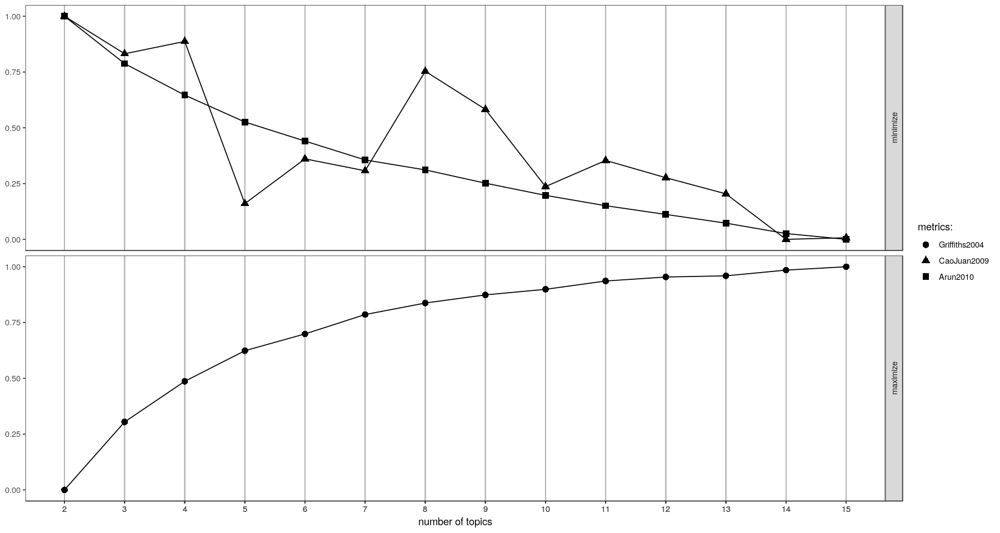

In [85]:
FindTopicsNumber_plot(tpcs)

Clairement, le nombre de topics est très grand, comme prévu.

In [86]:
tpcs=FindTopicsNumber(i_lda, topics=seq(5, 50, by=5),     metrics = c("Griffiths2004", "CaoJuan2009", "Arun2010"),
    method = "Gibbs",
    control = list(seed = 12345),
    mc.cores = 4L,
    verbose = TRUE)

fit models... done.
calculate metrics:
  Griffiths2004... done.
  CaoJuan2009... done.
  Arun2010... done.


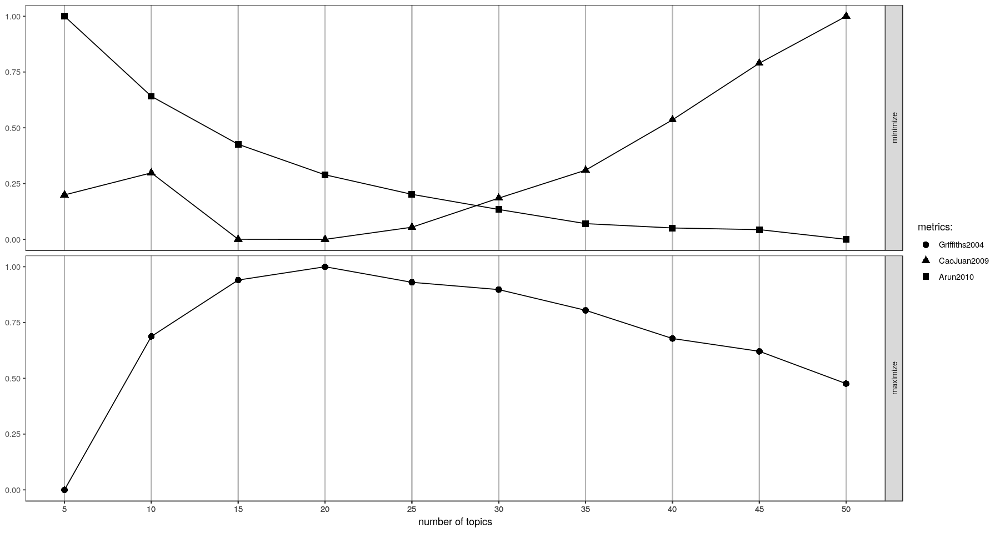

In [87]:
FindTopicsNumber_plot(tpcs)

Il y a un clair coude dans les 2 méthodes autour de 15-20. Soyons plus précis:

In [89]:
tpcs=FindTopicsNumber(i_lda, topics=c(15:25),     metrics = c("Griffiths2004", "CaoJuan2009", "Arun2010"),
    method = "Gibbs",
    control = list(seed = 12345),
    mc.cores = 4L,
    verbose = TRUE)

fit models... done.
calculate metrics:
  Griffiths2004... done.
  CaoJuan2009... done.
  Arun2010... done.


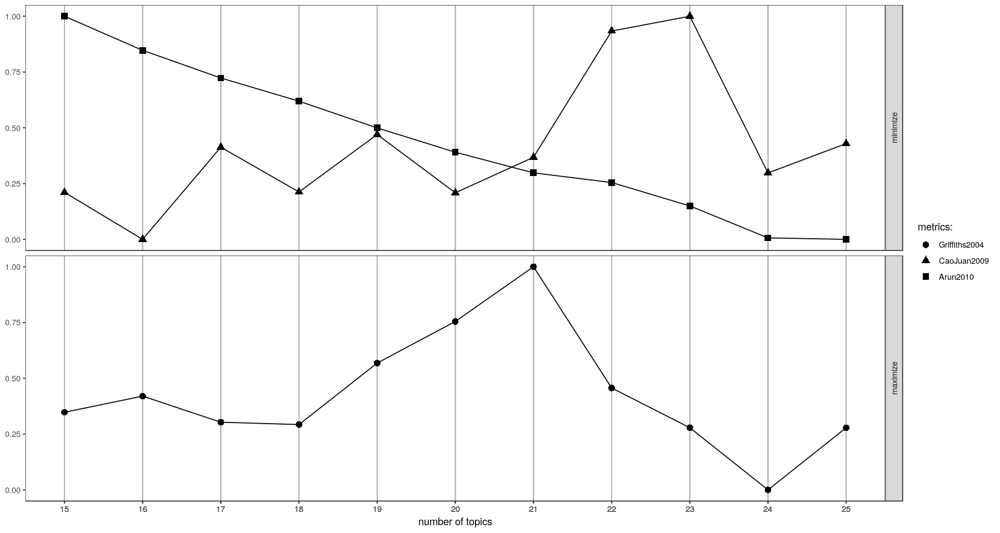

In [90]:
FindTopicsNumber_plot(tpcs)

Donc, 21-23 topics. Répétons l'analyse et cherchons le cannabis et la peine de mort:

In [91]:
t_lda=LDA(i_lda, k=21)

In [92]:
terms(t_lda, 5)

Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,⋯,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 17,Topic 18,Topic 19,Topic 20,Topic 21
enfant,justice,animal,élire,france,vitesse,permis,ordre,armer,justice,⋯,justice,peine,juger,fiscal,payer,policer,petit,cannabis,magistrat,militaire
mineur,payer,tribunal,procureur,état,revenir,point,forces,france,loi,⋯,français,peiner,justice,fraude,personne,gendarmerie,policier,droguer,crime,service
parent,avocat,contre,justice,sécurité,amende,conduire,force,pays,citoyen,⋯,juger,prison,décision,peine,prison,justice,gros,trafic,pourvoi,durer
judiciaire,droit,victime,casier,aussi,justice,passer,policer,guerre,policer,⋯,nationalité,travail,jugement,peiner,peiner,armer,etre,drogue,rendre,immédiat
impliquer,citoyen,français,vie,violence,excès,personne,manifestation,nucléaire,supprimer,⋯,pays,justice,droit,justice,voir,citoyen,prison,pays,délai,armer


In [94]:
apply(terms(t_lda, 50), 2, function(x){any(grepl("mort", x))})


Topic 1  Topic 2  Topic 3  Topic 4  Topic 5  Topic 6  Topic 7  Topic 8 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE 
 Topic 9 Topic 10 Topic 11 Topic 12 Topic 13 Topic 14 Topic 15 Topic 16 
   FALSE    FALSE    FALSE    FALSE     TRUE    FALSE    FALSE    FALSE 
Topic 17 Topic 18 Topic 19 Topic 20 Topic 21 
   FALSE    FALSE    FALSE    FALSE    FALSE

La peine de mort et la prison: 13
Le cannabis: 19

Examinons:

In [97]:
subs[topics(t_lda, 1, threshold=0.8)==19,]

title,body


Toujours des erreurs de classification...

In [98]:
subs[topics(t_lda, 1, threshold=0.8)==13,]

title,body
separation justice -pouvoir,<p>suprimer le ministere de la justice</p>
TRAVAUX D’INTÉRÊT GÉNÉRAL,<p>Pour les peines inférieures à 2 ans et dans le cas d'une première condamnation possibilité de faire des travaux d’intérêt général avec port d'un bracelet électronique. En cas de refus la peine est applicable</p>
rétablir l'expulsion pour les étranger qui ont commis au moins 2 délits,"<p>AU troisième délit l'étranger est expulsé, immédiatement si sa peine est infèrieure à 6 mois, sinon sa peine exécutée</p>"
"Faire effectuer réellement les peines, les cumuler et lever le sursis","<p>Les peines prononcées par la justice ne sont pas suffisamment exécutées (sauf pour les automobilistes, c'est vrai). Un dealer récidiviste qui se retrouve dehors au bout de qqes mois, ce n'est pas normal.</p><p>Pour tout condamné, il faut que la peine soit réellement exécutée, que les sursis précédents tombent.</p><p>En plus, comme pour les amendes ou les condamnation financières, les peines de prison doivent se cumuler (une condamnation de 6 mois + une condamnation de 3 mois = 9 mois et pas 4 mois après remises de peine...).</p>"
"Remplacer l’intime conviction par la preuve, la science politique par la science","<p>La condamnation doit être fondée uniquement sur des preuves, l’intime conviction est insuffisante et dangereuse.</p><p>Les magistrats doivent subir une formation de type scientifique et non pas science politique : le doute scientifique doit profiter à l’accusé</p>"
réinstauration de la peine de mort,<p>Ré instauration de la peine de mort.</p>
Application peines de prison,"<p>Quelle soit la peine de prison prononcée, celle-ci doit être faîte intégralement. </p><p>Construction de prison.</p><p>Le détenu doit payer une partie ou la totalité du coût de son emprisonnement (travail).</p>"
Castaner,"<p>Il faut rappeler au ministre de la \""gestapot\""en formation qu'il a été très copain avec un certain Zampa dirigeant du milieu marseillais et qu'aujourd'hui il se mettrait en prison! Et rappeler aux neurones célibataires des CRS et GARDES MOBILES qu'ils seront poursuivis pour coup et blessures volontaire en bandes organisées .</p>"
revoir la formation des policiers,<p>un policier doit garantir la protection de tous et être respectueux de la diversité des identités du pays . un savoir être doit être encouragé au détriment du mépris . Les Controles au faciès interdits . Ils doivent développer des compétences médiatrices et ne portes l'atrme que la nuit .</p>
Arrêtez avec cette justice de gauche! Réinstauration des peines planchers! Expulsion des multirécidivistes étrangers!,"<p>Stop au laxisme! </p><p>Réinstauration des peines planchers pour les crimes, viols, trafics</p><p>Etablissement d'un forfait de 10 ans de prison à partir de 10 délits</p><p>Expulsion des multirécidivistes étrangers avec suppression de la nationalité Française pour les bi-nationaux.</p>"


Répétons tout ça pour un autre prior (celui utilisé par défaut dans python=1/k ne peut pas être utilisé, mais...1/10 et 1/20 ne sont pas trop loin):

In [104]:
tpcs=FindTopicsNumber(i_lda, topics=5:50,     metrics = c("Griffiths2004", "CaoJuan2009", "Arun2010"),
    method = "Gibbs",
    control = list(seed = 12345, alpha=0.05),
    mc.cores = 4L,
    verbose = TRUE)

fit models... done.
calculate metrics:
  Griffiths2004... done.
  CaoJuan2009... done.
  Arun2010... done.


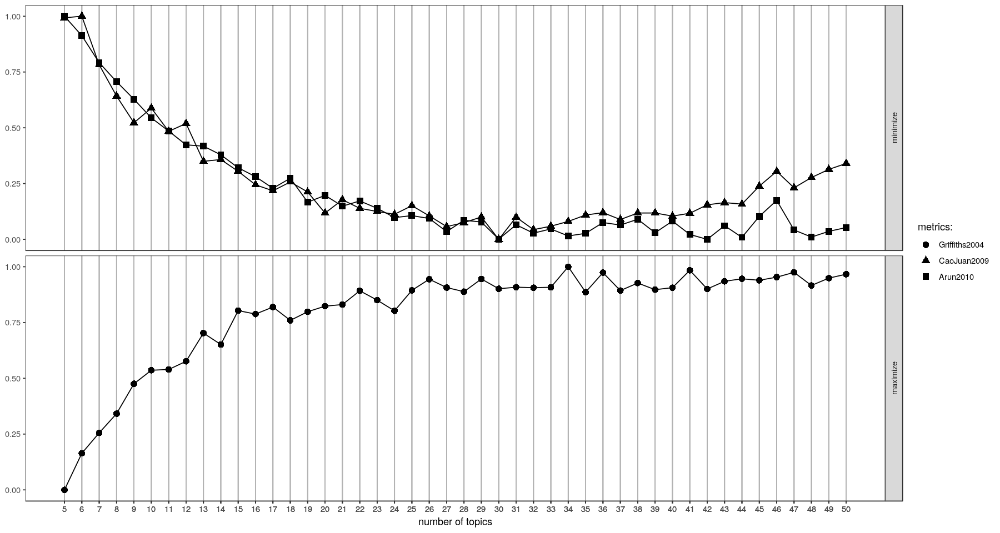

In [105]:
FindTopicsNumber_plot(tpcs)

In [108]:
t_lda=LDA(i_lda, k=30, method="Gibbs", control = list(alpha=0.05))

In [109]:
terms(t_lda, 5)

Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,⋯,Topic 21,Topic 22,Topic 23,Topic 24,Topic 25,Topic 26,Topic 27,Topic 28,Topic 29,Topic 30
payer,dernier,animal,franc,enfant,policer,personne,ordre,social,justice,⋯,cannabis,justice,trafic,sécurité,etre,statut,euro,peiner,intérêt,retrait
gros,europe,aussi,peuple,parent,justice,voir,force,aider,prison,⋯,droguer,juger,drogue,france,famille,fin,bureau,peine,travail,élire
petit,choix,penser,nation,violence,gendarmerie,justice,forces,contre,fiscal,⋯,consommation,magistrat,juger,zone,illégal,preuve,etc,prison,priser,suppression
faute,meme,assurance,population,garde,policier,droit,violence,durer,peine,⋯,trafic,indépendant,pédophilie,aussi,cas,loi,nucléaire,délit,général,président
société,avant,expert,partir,mineur,citoyen,trop,policer,criminel,fraude,⋯,légaliser,tribunal,internet,violence,succession,domaine,dissuasion,crime,petit,fonctionnaire


In [116]:
apply(terms(t_lda, 50), 2, function(x){any(grepl("mort", x))})


Topic 1  Topic 2  Topic 3  Topic 4  Topic 5  Topic 6  Topic 7  Topic 8 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE 
 Topic 9 Topic 10 Topic 11 Topic 12 Topic 13 Topic 14 Topic 15 Topic 16 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE 
Topic 17 Topic 18 Topic 19 Topic 20 Topic 21 Topic 22 Topic 23 Topic 24 
   FALSE    FALSE     TRUE    FALSE    FALSE    FALSE    FALSE    FALSE 
Topic 25 Topic 26 Topic 27 Topic 28 Topic 29 Topic 30 
   FALSE    FALSE    FALSE     TRUE    FALSE    FALSE

In [114]:
terms(t_lda, 30)[,c(19,28)]

Topic 19,Topic 28
tirer,peiner
examen,peine
enquête,prison
droit,délit
délai,crime
défenseur,condamner
pendant,priser
sortir,remettre
alors,français
mort,pays


In [122]:
subs[topics(t_lda, 1, threshold=0.5)==21,]

title,body


In [123]:
subs[topics(t_lda, 1, threshold=0.5)==19,]

title,body
Rémy fraisse,<p>ordonner la mise en examen du policier responsable de la mort de rémy fraisse</p>
Expulser les déboutés du droits d'asile,<p>Expulser les déboutés du droits d’asile</p>
Suppression du Sénat,<p>Le sénat pourra être remplacer par un groupe constituant tiré au sort permis des volontaires. </p>


In [124]:
subs[topics(t_lda, 1, threshold=0.5)==28,]

title,body
reforme,<p>La justice doit être plus sévère pas de peines plancher </p>
véritable justice,<p>Perpétuité réelle sans possibilité de libération dés la première condanation pour les crimes précéder d actes sexuels qu il s agisse de pédophilie ou de crime précéder de viol sur des femmes majeures.</p>
rétablir l'expulsion pour les étranger qui ont commis au moins 2 délits,"<p>AU troisième délit l'étranger est expulsé, immédiatement si sa peine est infèrieure à 6 mois, sinon sa peine exécutée</p>"
"Faire effectuer réellement les peines, les cumuler et lever le sursis","<p>Les peines prononcées par la justice ne sont pas suffisamment exécutées (sauf pour les automobilistes, c'est vrai). Un dealer récidiviste qui se retrouve dehors au bout de qqes mois, ce n'est pas normal.</p><p>Pour tout condamné, il faut que la peine soit réellement exécutée, que les sursis précédents tombent.</p><p>En plus, comme pour les amendes ou les condamnation financières, les peines de prison doivent se cumuler (une condamnation de 6 mois + une condamnation de 3 mois = 9 mois et pas 4 mois après remises de peine...).</p>"
réinstauration de la peine de mort,<p>Ré instauration de la peine de mort.</p>
Application peines de prison,"<p>Quelle soit la peine de prison prononcée, celle-ci doit être faîte intégralement. </p><p>Construction de prison.</p><p>Le détenu doit payer une partie ou la totalité du coût de son emprisonnement (travail).</p>"
Allonger le délai de prescription des infractions dissimulées,"<p class=\""ql-align-justify\"">Supprimer le délai butoir de douze ans pour les infractions occultes ou dissimulées.</p><p><br /></p>"
Peines de Prison,"<p>Pour tous les condamnés à la prison (quelle qu'en soit la durée ) et ayant la<u> double nationalité</u>, je propose de supprimer la nationalité Française et de subventionner le pays d'origine pour que le condamné execute sa peine de prison dans son pays d'origine et y reste</p><p><br /></p><p><br /></p>"
Expulsion,<p>Expulser tout Etranger (en situation régulière ou irrégulière) condamné pour crime ou pour délit en récidive</p>
peine de mort,<p>réinstauration de la peine de mort pour les auteurs d'attentat et crime sur enfants</p>



Mieux mais toujours des erreurs de classification... Essayons avec une racination plutôt qu'une lemmatisation? Les résultats seront sans doute similaires.

### LDA avec racination

In [3]:
d=fread("opinion.csv")

hd=fread("header", header=F)$V1
colnames(d)=hd
optype=fread("opinion_type.csv", header=F)
d$optype=optype$V2[match(as.character(d$opinion_type), optype$V1)]
e=fread("opinion_titre_noquote.csv", header=F, quote="", sep="\t")
text=paste(e$V1, d$body)
removeLinks = function(string){
  return(gsub(" ?(f|ht)(tp)(s?)(://)(.*)[.|/](.*)", " ", string))  
}

removeChars <- function(htmlString) {
  return(gsub("&.*?;", " ", htmlString))
}


cleanFun <- function(htmlString) {
  return(gsub("<.*?>", " ", htmlString))
    
}



gj=Corpus(VectorSource(text))
docs=gj;
#docs <- tm_map(docs, content_transformer(tolower))
docs=tm_map(docs, cleanFun)
docs=tm_map(docs, removeLinks)
docs=tm_map(docs, removeChars)
docs_untrans=docs
#docs <- tm_map(docs, removeNumbers)
docs=tm_map(docs, removeWords, stopwords("french"))
replacePunctuation <- content_transformer(function(x) {return (gsub("[[:punct:]]"," ", x))})

docs=tm_map(docs, replacePunctuation)
docs=tm_map(docs, stripWhitespace)
docs=tm_map(docs, stemDocument, language="fr")
#docs=tm_map(docs, iconv, from="UTF-8",to="ASCII//TRANSLIT")
docs=tm_map(docs, stri_trans_general, "Latin-ASCII")
torem=c("plus", "tout", "etre", "tous", "fair", "faut", "doit", "bien", "non", "donc")
docs=tm_map(docs, removeWords, torem)

Warning message in tm_map.SimpleCorpus(docs, cleanFun):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeLinks):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeChars):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, replacePunctuation):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stemDocument, language = "fr"):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stri_trans_general, "Latin-ASCII"):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, torem):
“transformation drops documents”

In [126]:
i_lda=DocumentTermMatrix(docs[d$optype=="Justice, Police, Armée"])


In [129]:
tpcs=FindTopicsNumber(i_lda, topics=5:50,     metrics = c("Griffiths2004", "CaoJuan2009", "Arun2010"),
    method = "Gibbs",
    control = list(seed = 12345, alpha=0.05),
    mc.cores = 4L,
    verbose = TRUE)

fit models... done.
calculate metrics:
  Griffiths2004... done.
  CaoJuan2009... done.
  Arun2010... done.


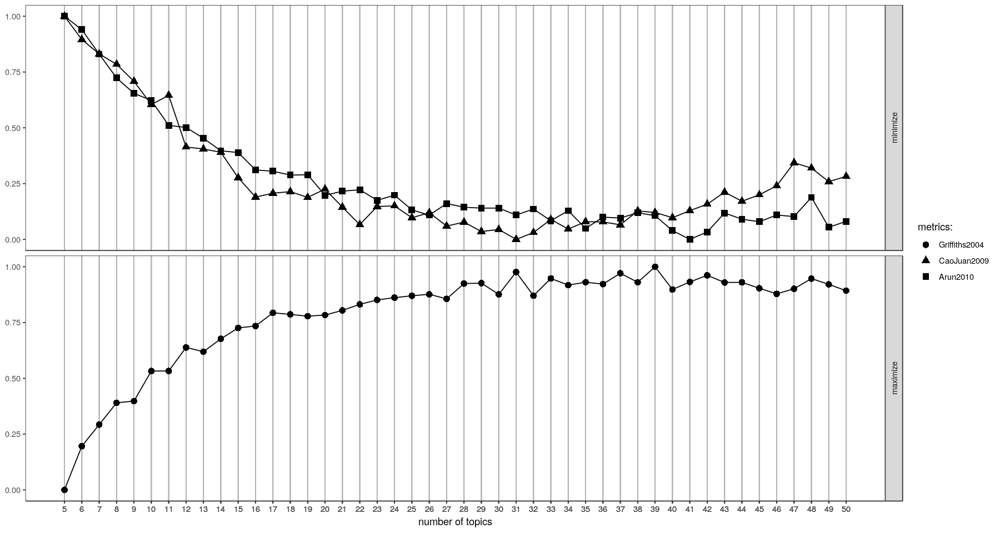

In [130]:
FindTopicsNumber_plot(tpcs)

In [131]:
t_lda=LDA(i_lda, k=30, method="Gibbs", control = list(alpha=0.05))
terms(t_lda, 5)

Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,⋯,Topic 21,Topic 22,Topic 23,Topic 24,Topic 25,Topic 26,Topic 27,Topic 28,Topic 29,Topic 30
famill,casi,organ,retrait,log,enfant,priv,cannab,djihad,prison,⋯,des,manifest,pein,magistrat,dissuas,vitess,violenc,justic,justic,sort
notair,vierg,minimum,elus,popul,pedophil,control,drogu,ministr,pein,⋯,les,droit,prison,pourvoi,nucleair,amend,enfant,jug,autr,tir
proteg,assur,republ,president,organis,franc,franc,consomm,castan,interet,⋯,pour,propos,condamn,premi,adn,point,parent,independ,comm,inform
faux,judiciair,benall,suppress,influenc,pornograph,statut,legalis,mettr,general,⋯,justice,respect,crim,commissair,civil,perm,femm,pouvoir,fait,moin
success,present,francais,mandat,devon,impliqu,immigr,trafic,jusqu,social,⋯,etre,person,del,cour,euros,revenus,gard,magistrat,person,total


In [132]:
subs[topics(t_lda, 1, threshold=0.5)==8,]

title,body
Trafic de drogue : Saisie des biens du trafiquant ainsi que de son entourage si pas de justificatifs,<p>Trafic de drogue : Saisie des biens du trafiquant ainsi que de son entourage si pas de justificatifs</p>
Dépénalisation de toutes les drogues,"<p>Réduire la consommation de drogues via la dépénalisation : <strong>Une diminution de la consommation de toutes les drogues</strong></p><p><br /></p><p>La personne qui se drogue n'ai pas un criminel, mais un malade.</p><p><br /></p><p>Dépénalisons le Cannabis, La MDMA, L'Ecstasy, La Cocaine, La Kétamine, Le Crack, Les Amphétamines, L'Héroine et bien plus encore.. Des résultats !</p>"
police contre la prohibition. ( PCP ),<p>je vous propose se site très intéressent pour plus de lumière sur la prohibition des drogues douce comme le cannabis.</p><p> ( PCP ) POLICE CONTRE LA PROHIBITION.</p><p>http://police.etc.over-blog.net/tag/drogues%20&amp;%20legislation/</p>
Dépénalisation de la consommation de cannabis,"<p>En finir avec la lutte contre la drogue, qui est un échec avéré ! La France est un des pays qui mène la politique anti-drogue la plus dure, et qui malgré cela (ou à cause de cela ?) a le plus de consommateurs.</p>"
Coucou !,"<p>J\""aimerai plus de prévention et moins de répression,exemple si vous grillez malencontreusement un stop ou un feu rouge sans provoquer d'accident ne pas etre systématiquement sanctionner mais plutot disputer et sensibilisé a faire plus attention la prochaine fois.</p>"


In [134]:
apply(terms(t_lda, 50), 2, function(x){any(grepl("mort", x))})
terms(t_lda, 10)[,c(7,25)]

Topic 1  Topic 2  Topic 3  Topic 4  Topic 5  Topic 6  Topic 7  Topic 8 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE     TRUE    FALSE 
 Topic 9 Topic 10 Topic 11 Topic 12 Topic 13 Topic 14 Topic 15 Topic 16 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE    FALSE 
Topic 17 Topic 18 Topic 19 Topic 20 Topic 21 Topic 22 Topic 23 Topic 24 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE     TRUE    FALSE 
Topic 25 Topic 26 Topic 27 Topic 28 Topic 29 Topic 30 
   FALSE    FALSE    FALSE    FALSE    FALSE    FALSE

Topic 7,Topic 25
priv,dissuas
control,nucleair
franc,adn
statut,civil
immigr,euros
lois,sous
format,actuel
laiss,chang
francais,mainten
illegal,marin


Clairement la lemmatisation donne de meilleurs résultats. Voyons, avec la lemmatisation, si on peut détecter les propositions qui parlent de plusieurs sujets.

## Clustering du top 2 des topics: peut-on discerner les multi-sujets des autres?

In [32]:
t_lda=LDA(i_lda, k=30, method="Gibbs", control = list(alpha=1/30))


 Named int [1:764] 4 14 4 12 3 13 29 13 23 3 ...
 - attr(*, "names")= chr [1:764] "1" "2" "3" "4" ...


In [36]:
maxp=apply(posterior(t_lda)$topics, 1, function(x){(x[order(x, decreasing=T)])[1:2]})

In [37]:
dim(maxp)

[1]   2 764

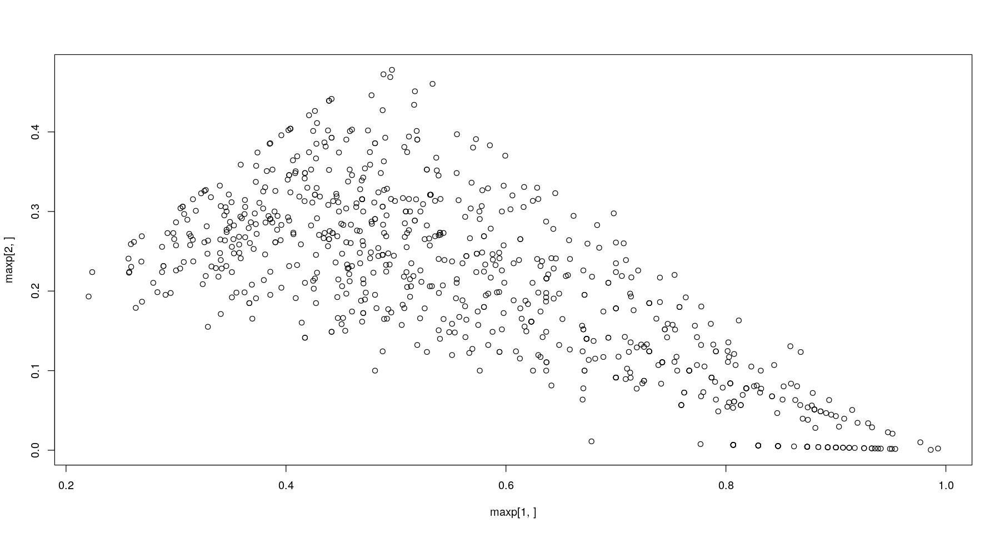

In [40]:
plot(maxp[1,], maxp[2,])

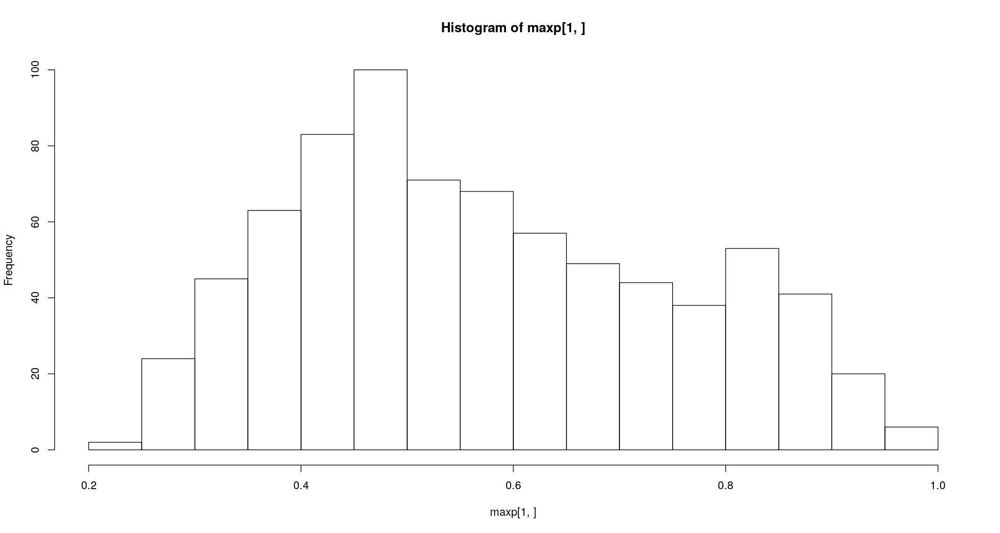

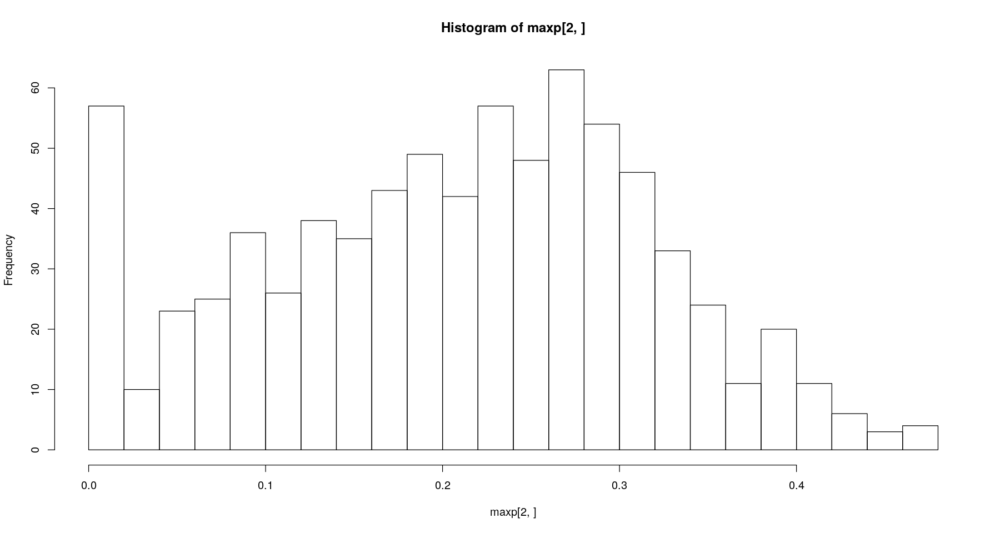

In [45]:
hist(maxp[1,], breaks=20)
hist(maxp[2,], breaks=20)

Résultats surprenants: la majorité des sujets traiteraient de 2 sujets...

# TEXT2VEC

Espérons que cette fois c'est la bonne.

In [46]:
library(text2vec)

In [1]:
install.packages("softmaxreg")

Installing package into ‘/home/agilly/R/x86_64-pc-linux-gnu-library/3.5’
(as ‘lib’ is unspecified)


library(data.table);
pretrain=fread("frWac_no_postag_no_phrase_700_skip_cut50.txt.clean")

In [5]:
library(softmaxreg)

In [23]:
library(data.table)
library(tm)
library(stringi)
library(textstem)
library(koRpus.lang.fr)
library(wordcloud)
library(text2vec)
library(gsubfn)
library(dendextend)
d=fread("opinion.csv")

hd=fread("header", header=F)$V1
colnames(d)=hd
optype=fread("opinion_type.csv", header=F)
d$optype=optype$V2[match(as.character(d$opinion_type), optype$V1)]
e=fread("opinion_titre_noquote.csv", header=F, quote="", sep="\t")
text=paste(e$V1, d$body)
removeLinks = function(string){
  return(gsub(" ?(f|ht)(tp)(s?)(://)(.*)[.|/](.*)", " ", string))  
}

removeChars <- function(htmlString) {
  return(gsub("&.*?;", " ", htmlString))
}


cleanFun <- function(htmlString) {
  return(gsub("<.*?>", " ", htmlString))
    
}



gj=Corpus(VectorSource(text))
docs=gj;
docs <- tm_map(docs, content_transformer(tolower))
docs=tm_map(docs, cleanFun)
docs=tm_map(docs, removeLinks)
docs=tm_map(docs, removeChars)
docs_untrans=docs
#docs <- tm_map(docs, removeNumbers)
docs=tm_map(docs, removeWords, stopwords("french"))
replacePunctuation <- content_transformer(function(x) {return (gsub("[[:punct:]]"," ", x))})

docs=tm_map(docs, replacePunctuation)
docs=tm_map(docs, stripWhitespace)
selfcorr = c("sécurité", "sécurité", "", "", "économie", "économie", "kilomètre", "milliard", "agroalimentaire", "dioxyde", "", "référendum initiative citoyenne")
names(selfcorr)=c("sécu", "secu", "ème", "eme", "éco", "eco", "km", "mds", "agro", "co2", "ni", "ric")
selfcordict=split(unname(selfcorr),names(selfcorr))
replace_words=function(string, dict, i=length(dict)){
    if(i==1){return(gsub(paste0('\\b', names(dict)[1], '\\b'), dict[1], string))}
    else{return(gsub(paste0('\\b', names(dict)[i], '\\b'), dict[names(dict)[i]], replace_words(string, dict, i-1)))}    
}
replace_words_nothing=function(string, dict, i=length(dict)){
    if(i==1){return(gsub(paste0('\\b', dict[1], '\\b'), " ", string))}
    else{return(gsub(paste0('\\b', dict[1], '\\b'), " ", replace_words(string, dict, i-1)))}    
}


correction =function (x){
for (wd in setdiff(unlist(hunspell(x, dict="fr")), motsaufs)){
  x=gsub(paste0('\\b', wd, '\\b'), unlist(hunspell_suggest(wd, dict="fr"))[1] ,x)  
}
}
correct_text =function (content){paste(sapply(strsplit(tolower(content), " ", fixed=T)[[1]], correction), collapse=' ')}
corrected=tm_map(docs, tolower)
corrected=tm_map(corrected, replace_words, selfcorr)
corrected <- tm_map(corrected, removeNumbers)
docs=tm_map(docs, stripWhitespace)

lemdict=make_lemma_dictionary(corrected, engine="treetagger", lang="fr", path="/mnt/k/Downloads/vraidebat")

doclem=tm_map(corrected, lemmatize_strings, dictionary=lemdict)
stops=tm_map(doclem, removeWords, stopwords("french"))

mul=sapply(stops, function(x){grepl("\\|", x)})
wds=sapply(stops, function(x){grep('|', strsplit(x, " +")[[1]], fixed=T, value=T)})
removeLemmas=function(x){
    return(paste(strsplit(x, '|', fixed=T)[[1]], collapse=" "))
}
stops_noinc=stops
stops_noinc$content=sapply(stops, removeLemmas)

removeSmall= function(str){
    gsub('\\b\\w{1,2}\\s','',str)
}

stops_noinc$content=sapply(stops_noinc, removeSmall)
redondant=c("plus", "tout", "faire", "falloir", "devoir", "pouvoir", "être", "donc", "comme",
            "chaque","non", "autre" , "bien", "celui", "grand", "mettre")
stops_noinc=tm_map(stops_noinc, removeWords, redondant)
d$n_vote=d$vote_count_nok+d$vote_count_ok+d$vote_count_mitige
i_lda=DocumentTermMatrix(stops_noinc[d$optype=="Justice, Police, Armée"])

 subs=d[d$optype=="Justice, Police, Armée", c("title", "body")]
d$n_vote=d$n_vote+1
d$vote_count_ok=d$vote_count_ok+1
d$vote=d$vote_count_ok/d$n_vote


Warning message in tm_map.SimpleCorpus(docs, content_transformer(tolower)):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, cleanFun):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeLinks):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeChars):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("french")):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, replacePunctuation):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, stripWhitespace):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(docs, tolower):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(corrected, replace_words, selfcorr):
“transformation drops documents”Warning message in tm_map.SimpleCorpus(corrected, removeNumbers):
“transformation drops documents”Warning message in tm_ma

In [24]:
embed=wordEmbed(stops_noinc[d$optype=="Justice, Police, Armée"], dictionary=pretrain, meanVec=T)

In [16]:
dim(embed)

[1] 764 700

In [18]:
pca=princomp(embed)

In [19]:
str(pca)

List of 7
 $ sdev    : Named num [1:700] 0.165 0.149 0.125 0.115 0.1 ...
  ..- attr(*, "names")= chr [1:700] "Comp.1" "Comp.2" "Comp.3" "Comp.4" ...
 $ loadings: 'loadings' num [1:700, 1:700] 0.08876 -0.06139 -0.02601 0.07528 0.00146 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:700] "V2" "V3" "V4" "V5" ...
  .. ..$ : chr [1:700] "Comp.1" "Comp.2" "Comp.3" "Comp.4" ...
 $ center  : Named num [1:700] 0.04262 -0.02149 -0.00856 -0.02241 0.02227 ...
  ..- attr(*, "names")= chr [1:700] "V2" "V3" "V4" "V5" ...
 $ scale   : Named num [1:700] 1 1 1 1 1 1 1 1 1 1 ...
  ..- attr(*, "names")= chr [1:700] "V2" "V3" "V4" "V5" ...
 $ n.obs   : int 764
 $ scores  : num [1:764, 1:700] 0.0208 0.1381 -0.2425 -0.094 0.1556 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : NULL
  .. ..$ : chr [1:700] "Comp.1" "Comp.2" "Comp.3" "Comp.4" ...
 $ call    : language princomp(x = embed)
 - attr(*, "class")= chr "princomp"


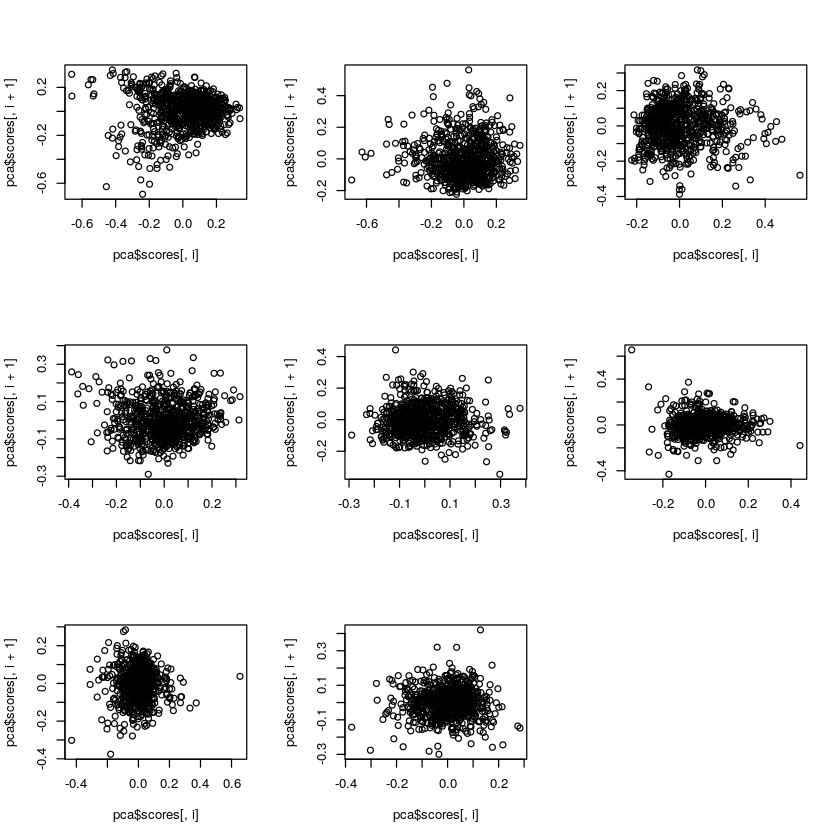

In [22]:
par(mfrow=c(3,3))
for(i in 1:8){
plot(pca$scores[,i], pca$scores[,i+1])
    }

PCA shows strictly nothing. Let's try something (supposedly) better, t-SNE.

In [25]:
install.packages("Rtsne")

Installing package into ‘/home/agilly/R/x86_64-pc-linux-gnu-library/3.5’
(as ‘lib’ is unspecified)


In [33]:
library(Rtsne)
tsne=Rtsne(embed,dims=2, perplexity=50)

ERROR: Error in Rtsne.default(embed, dims = 2, perplexity = 50): Remove duplicates before running TSNE.


In [39]:
# duplicates
(1:nrow(embed))[duplicated(embed) | duplicated(embed, fromLast = TRUE)]

[1] 301 699

In [41]:
subs[c(301,699),]

title,body
Interdire les visages masqués pour les forces de l'ordre lors des manifestations,"<p>Afin d'éviter toute dérive répressive des forces de l'ordre et d'accroître leur sentiment d'impunité,</p><p>l'identification des agents des forces de l'ordre lors d'actes répréhensibles tels qu'un emploi abusif et</p><p>inapproprié des armes de répression (LBD, grenades de désencerclement, etc) doit pouvoir être faite en</p><p>toute transparence et sans ambiguïté.</p><p>Il est inconcevable d'exiger des manifestants qu'ils soient à visages découverts (sans pouvoir se protéger</p><p>des gaz par exemple à leur encontre alors qu'aucune menace est avérée) alors que les forces de l'ordre</p><p>interviennent elles-mêmes généralement masquées pour commettre les pires actions sur les</p><p>manifestants (éborgnements, traumatismes, etc) sans risque d'être identifiées.</p><p>C'est insupportable pour les citoyens que nous sommes.</p><p>Si les forces de l'ordre agissaient dans le respect strict des règles du maintien de l'ordre, elles n'auraient</p><p>aucune crainte à avoir et devraient travailler à visage découvert. Le masquage des forces de l'ordre</p><p>indique clairement la volonté du gouvernement d'autoriser les forces à outrepasser leur droit en matière</p><p>de maintien de la sécurité. Ceci est inacceptable dans une vraie démocratie.</p>"
Interdire les visages masqués pour les forces de l'ordre lors des manifestations,"<p>Afin d'éviter toute dérive répressive des forces de l'ordre et d'accroître leur sentiment d'impunité, l'identification des agents des forces de l'ordre lors d'actes répréhensibles tels qu'un emploi abusif et inapproprié des armes de répression (LBD, grenades de désencerclement, etc) doit pouvoir être faite en toute transparence et sans ambiguïté.</p><p>Il est inconcevable d'exiger des manifestants qu'ils soient à visages découverts (sans pouvoir se protéger des gaz par exemple à leur encontre alors qu'aucune menace est avérée) alors que les forces de l'ordre interviennent elles-mêmes généralement masquées pour commettre les pires actions sur les manifestants (éborgnements, traumatismes, etc) sans risque d'être identifiées. </p><p>C'est insupportable pour les citoyens que nous sommes. </p><p>Si les forces de l'ordre agissaient dans le respect strict des règles du maintien de l'ordre, elles n'auraient aucune crainte à avoir et devraient travailler à visage découvert. Le masquage des forces de l'ordre indique clairement la volonté du gouvernement d'autoriser les forces à outrepasser leur droit en matière de maintien de la sécurité. Ceci est inacceptable dans une vraie démocratie.</p>"


In [42]:
tsne=Rtsne(embed[-699,],dims=2, perplexity=50)

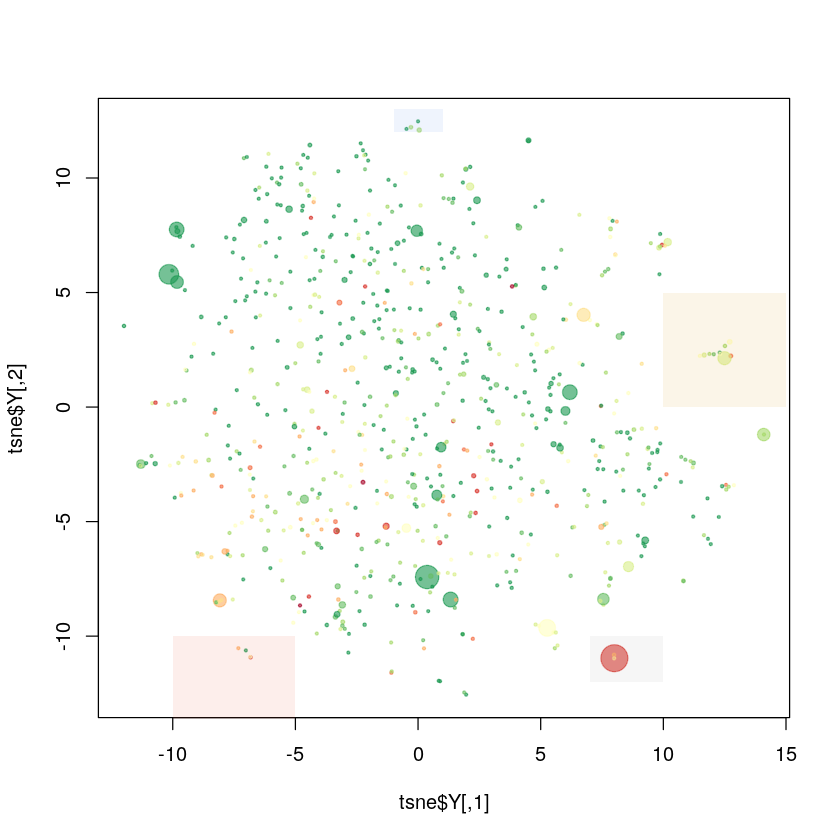

In [104]:
subs=d[d$optype=="Justice, Police, Armée", c("vote","n_vote","vote_count_ok", "vote_count_nok", "vote_count_mitige", "optype","title", "body")]
subsi=subs[-699,]

library(RColorBrewer)
pal=brewer.pal(11, "RdYlGn")
subsi$votecat=pal[as.numeric(cut(subsi$vote, seq(-0.00001,1, length.out=11)))]

plot(tsne$Y, pch=20, cex=0.5+4*(subsi$n_vote/max(subsi$n_vote)), col=adjustcolor(subsi$votecat, alpha=0.6))
rect(xleft=10, xright=15, ybottom=0, ytop=5, col=adjustcolor("goldenrod", alpha=0.1), border=NA)
rect(xleft=-10, xright=-5, ybottom=-15, ytop=-10, col=adjustcolor("tomato2", alpha=0.1), border=NA)
rect(xleft=-1, xright=1, ybottom=12, ytop=13, col=adjustcolor("cornflowerblue", alpha=0.1), border=NA)
rect(xleft=7, xright=10, ybottom=-12, ytop=-10, col=adjustcolor("darkgray", alpha=0.1), border=NA)


In [94]:

newcoord=tsne$Y
colnames(newcoord)=c("x", "y")
newcoord=as.data.table(newcoord)

# xleft=10, xright=15, ybottom=0, ytop=5
idcs=(1:nrow(newcoord))[newcoord$x>10 & newcoord$y>0 & newcoord$y<5]
am=subsi[idcs,]
am[-(2:4),]
approbation(am[-(2:4),])
nvote(am[-(2:4),])

vote,n_vote,vote_count_ok,vote_count_nok,vote_count_mitige,optype,title,body


[1] 0.6823658

[1] 913

In [87]:
# xleft=-10, xright=-5, ybottom=-15, ytop=-10
idcs=(1:nrow(newcoord))[newcoord$x>-10 & newcoord$x< -5 & newcoord$y< -10]
subsi[idcs,]

vote,n_vote,vote_count_ok,vote_count_nok,vote_count_mitige,optype,title,body
1.0000000,1,1,0,0,"Justice, Police, Armée",Justice armee police gendarmerie,<p>Abolir privileges des generaux des forces armees </p><p>Donner plus de moyens a la justice </p><p>Pouvoir revoquer les juges incompetents qui sont intouchables</p><p>Renforcer les moyens en effectifs et en materiel des armees et des fonctionnaires de police et de gendarmerie </p><p>Ameliorer leurs formations</p><p><br /></p><p><br /></p><p><br /></p>
0.3333333,6,2,4,0,"Justice, Police, Armée",Armee,<p>Supprimer l'armee</p>
0.1764706,17,3,11,3,"Justice, Police, Armée",suppression de la gendarmerie,"<p>supprimer la gendarmerie comme cela a été fait en Belgique. chaque gendarme a les memes pouvoirs que le president de la république et meme plus. il peut detruire votre vie en l'ordonnant a la justice. Elle est devenue inutile et nefaste au peuple. l europe n en veut plus , espagne ,italie sont aussi dans le viseur de l Europe. sachez que chaque gendarme beneficie d un logement gratuit paye avec nos impots et tous autres avantages en nature qui sont caches au peuple.</p>"
0.5000000,4,2,2,0,"Justice, Police, Armée",dissolution de la gendarmerie,"<p><span style=\""background-color:rgb(255,255,255);color:rgb(33,37,41);\"">supprimer la gendarmerie et la fusionner avec la Police, bien plus compétente.Chaque gendarme a les memes pouvoirs que le president de la république et meme plus. il peut detruire votre vie en l'ordonnant a la justice. La gendarmerie est devenue inutile et nefaste au peuple. l europe n en veut plus , espagne ,italie sont aussi dans le viseur de l Europe. sachez que chaque gendarme beneficie d un logement gratuit paye avec nos impots et tous autres avantages en nature qui sont caches au peuple.</span></p>"


In [89]:
approbation=function(x){sum((x$n_vote*x$vote)/sum(x$n_vote))}
nvote=function(x){sum(x$n_vote)}
approbation(subsi[idcs,])

[1] 0.2857143

In [90]:
# xleft=-1, xright=1, ybottom=12
idcs=(1:nrow(newcoord))[newcoord$x> -1 & newcoord$x< 1 & newcoord$y> 12]

subsi[idcs,]
nvote(subsi[idcs,])
approbation(subsi[idcs,])

vote,n_vote,vote_count_ok,vote_count_nok,vote_count_mitige,optype,title,body
0.7572816,103,78,17,8,"Justice, Police, Armée",Présence obligatoire de retransmission vidéo dans les tribunaux,<p>Permettre au public de savoir ce qui se passe dans les tribunaux grace à une retransmition vidéo sur un site internet par exemple </p>
1.0000000,2,2,0,0,"Justice, Police, Armée",caméra dans les tribunaux pour retransmettre les procès sur le net puisque jugement rendu au nom du peuple Français,<p>caméra dans les tribunaux pour retransmettre les procès sur le net puisque jugement rendu au nom du peuple Français </p>
1.0000000,1,1,0,0,"Justice, Police, Armée",Autoriser caméras et micros dans les tribunaux,<p>L'autorité judiciaire n'est plus indépendante. Justice à deux vitesses dans les prétoires... Il faut rétablir une réelle transparence en autorisant les enregistrements et l'utilisation des smartphones.</p>
0.7000000,50,35,12,3,"Justice, Police, Armée",Caméra obligatoire dans les tribunaux avec diffusion en direct et replay,<p>Pour la presence de caméra dans les tribunaux afin d'apporter de la transparence dans notre justice.</p>


[1] 156

[1] 0.7435897

In [75]:
mi=stops_noinc[d$optype=="Justice, Police, Armée"]
mi[newcoord$x> -1 & newcoord$x< 1 & newcoord$y> 12]$content

[1] "présence obligatoire retransmission vidéo tribunal permettre public savoir passer tribunal grace retransmition vidéo site internet exemple"                                                                                                                                                                     
[2] "caméra tribunal retransmettre procès net puisque jugement rendre nom peuple français caméra tribunal retransmettre procès net puisque jugement rendre nom peuple français"                                                                                                                                      
[3] "autoriser caméra micro tribunal autorité judiciaire  indépendant justice deux vitesse prétoire  rétablir réel transparence autoriser enregistrement utilisation smartphones"                                                                                                                                    
[4] "pris compte animal compagnie famille  placer déclaration feuille impôt  animal compagnie mention identifier stériliser éviter abandon parfois maltraitance déclaration obligatoire contrôler supplément impôt rappeler identification animal compagnie chat chien obligatoire depuis plusieurs année maintenant"

In [105]:
#xleft=7, xright=10, ybottom=-12, ytop=-10
idcs=(1:nrow(newcoord))[newcoord$x> 7 & newcoord$x< 10 & newcoord$y< -10]

subsi[idcs,]
nvote(subsi[idcs,])
approbation(subsi[idcs,])

vote,n_vote,vote_count_ok,vote_count_nok,vote_count_mitige,optype,title,body,votecat
0.1496711,1824,273,1439,112,"Justice, Police, Armée",réinstauration de la peine de mort,<p>Ré instauration de la peine de mort.</p>,#D73027
0.3548387,31,11,17,3,"Justice, Police, Armée",peine de mort,<p>réinstauration de la peine de mort pour les auteurs d'attentat et crime sur enfants</p>,#FDAE61
0.4705882,17,8,6,3,"Justice, Police, Armée",refus du retour des djihadistes / peine de mort,<p>refus du retour des djihadistes / peine de mort</p>,#FEE08B


[1] 1872

[1] 0.1559829

In [106]:
install.packages("dbscan")

Installing package into ‘/home/agilly/R/x86_64-pc-linux-gnu-library/3.5’
(as ‘lib’ is unspecified)


In [107]:
library(dbscan)

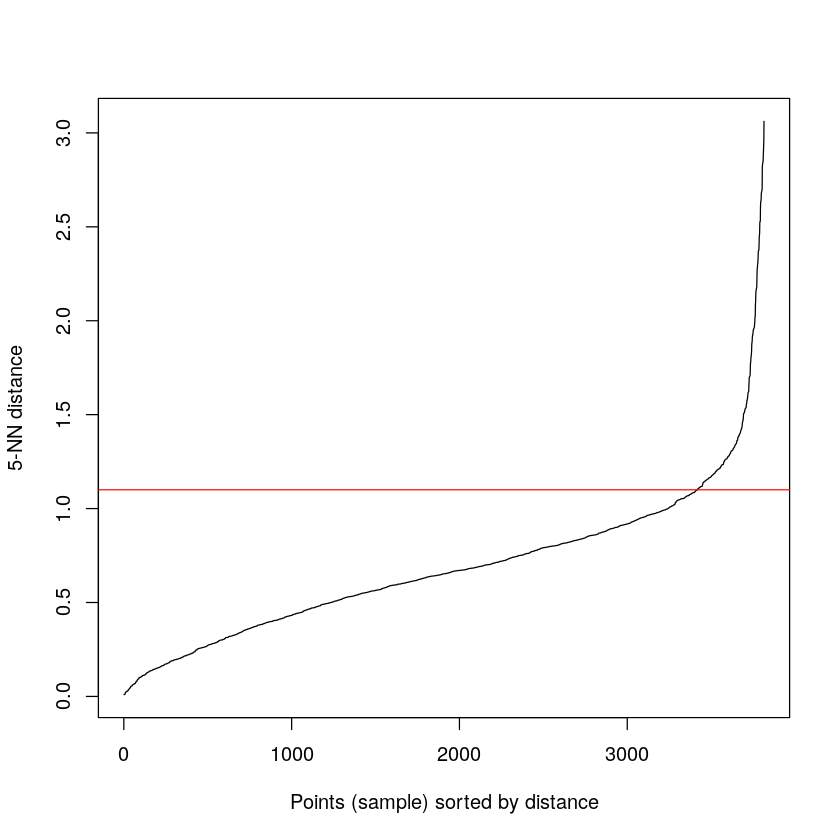

In [111]:
kNNdistplot(tsne$Y, k=5)
abline(h=1.1, col="red")

In [140]:
dbs=dbscan(tsne$Y, 0.8, 3)

Warning message in hullplot(tsne$Y, dbs$cluster, pch = 20, cex = 0.5 + 4 * (subsi$n_vote/max(subsi$n_vote))):
“Not enough colors. Some colors will be reused.”

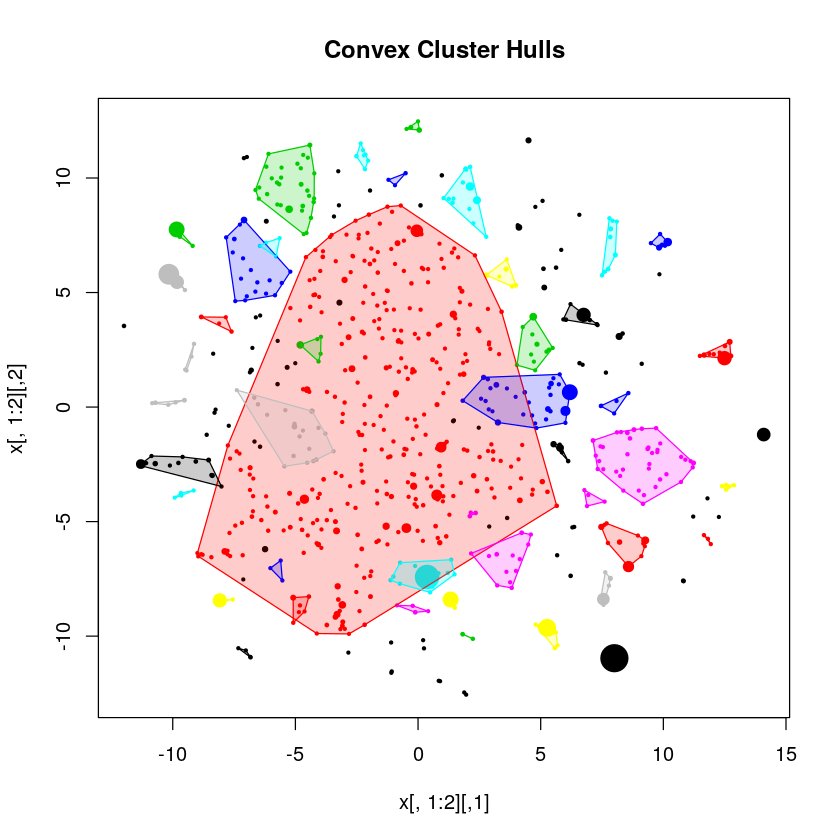

In [141]:
hullplot(tsne$Y, dbs$cluster, pch=20, cex=0.5+4*(subsi$n_vote/max(subsi$n_vote)))

In [145]:
sort(table(dbs$cluster))


 24  25  29  34  35  38  43  21  23  36  37  39  40  41  42  44   2  11  26  30 
  3   3   3   3   3   3   3   4   4   4   4   4   4   4   4   4   5   5   5   5 
 31  32  22  33   6   8  12  14  15  27  17  20   9  18   4  13  16  28   3   7 
  5   5   6   6   7   7   7   7   7   7  10  10  11  11  13  13  14  14  18  19 
 10  19   5   0   1 
 30  30  39  73 317 

In [155]:
subsi[dbs$cluster==30,]

vote,n_vote,vote_count_ok,vote_count_nok,vote_count_mitige,optype,title,body,votecat
0.5000000,8,4,2,2,"Justice, Police, Armée",CASTRATION CHIMIQUE,<p>Obligation de castration chimique pour tous les pédophiles et violeurs</p>,#FFFFBF
0.7916667,24,19,5,0,"Justice, Police, Armée",Pédophilie,<p>Protection absolue de l'enfance. Éradication de la pédophilie et condamnation à vie en milieu sécurisé pour tout pédophile. </p>,#A6D96A
0.2000000,5,1,3,1,"Justice, Police, Armée",castration violeurs,"<p>Envisager la possibilité de faire castrer les violeurs récidivistes, ainsi que les jeunes coupables ou complices de viols en réunion. </p>",#F46D43
0.7500000,4,3,0,1,"Justice, Police, Armée",Signalisation des pédophiles et des violeurs,<p>A la mairie de chaque commune ainsi que sur internet il faut pouvoir repérer les violeurs et les pédophiles.</p>,#A6D96A
0.9000000,30,27,1,2,"Justice, Police, Armée",PEDOPHILIE (et Zoophilie),"<p>Que l'âge de la pédophilie soit à 15 ans et non pas à 13 ans comme le veut LAREM. Ils refusé les demandes des associations de la protection de l'enfance. Que l'acte \""pédophile ne soit pas séparé en 2, d'un côté les attouchements, et de l'autre la pénétration, les adultes jugent qu'un attouchement n'est pas si grave...ce qui n'est pas la réalité dans la tête d'un enfant, l'enfant entre les 2 sera autant traumatisé par l'un que par l'autre. Que la détention de vidéos pédo-pornographiques ne soit pas à 2 ans de prison (peine jamais effectuée puisque sous 2 ans, les pédophiles n'iront pas en prison = durcissement des peines de prisons pour les pédophiles) proposition = 15 ans pour détention de vidéo pédo pornographique. Que la perpétuité à vie soit requise sans possibilité de sortie pour les actes pédophiles (attouchements et/ou pénétration) ..et des experts n'y changeront rien, un pédophile restera à vie un pédophile et en prison ils se tiennent bien = pas d'enfant...! Les politiques estiment que c'est un sujet \""mineur\""...et un lobby pédophile existe bel et bien tant dans les sphères politiques et autres..ça suffit, les français s'émeuvent quant il y a meurtre incluant viol, mais il faudrait que ça change un pédophile ou une pédophile ne change pas, l'inceste est à mettre au même niveau..Quant à la zoophilie\""via internet\"" et c'est ahurissant des milliers de petites annonces pour se servir des animaux comme sex toys vivants (comme le font les pédophiles avec les enfants d'ailleurs) on ne touche ni aux enfants ni aux animaux sexuellement, certains n'ont pas l'air d'avoir encore \""compris\"" dans ce pays y compris les politiques de gauche comme de droite..d'aillerus. </p>",#1A9850


In [116]:
?hullplot

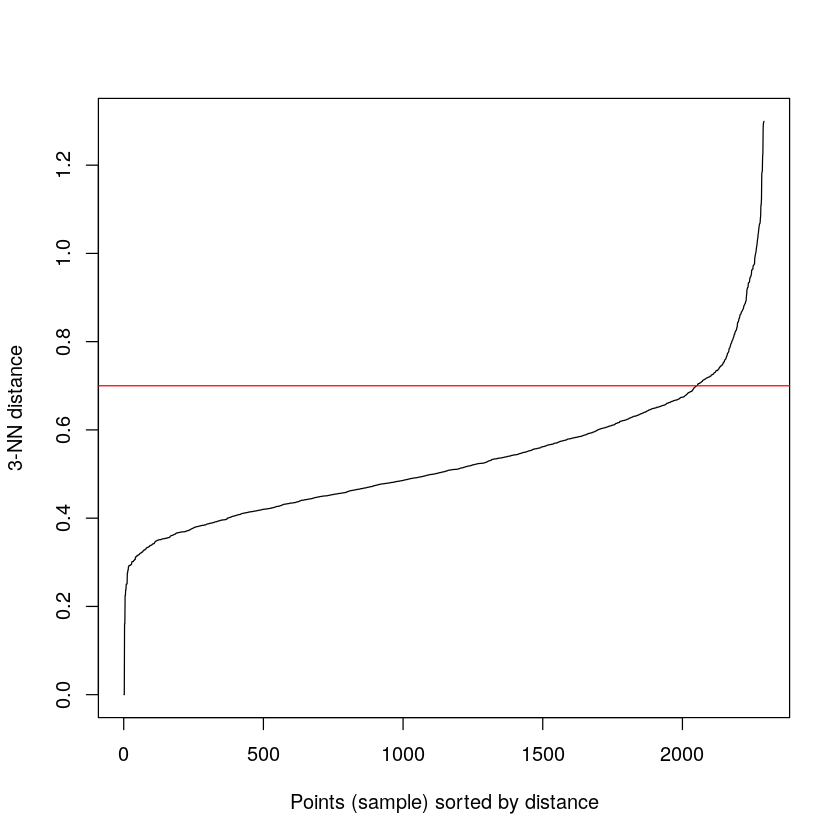

In [127]:
kNNdistplot(embed, k=3)
abline(h=0.7, col="red")

In [137]:
dbs=dbscan(embed[-699,], 0.5, 3)

In [138]:
dbs

DBSCAN clustering for 763 objects.
Parameters: eps = 0.5, minPts = 3
The clustering contains 1 cluster(s) and 359 noise points.

  0   1 
359 404 

Available fields: cluster, eps, minPts

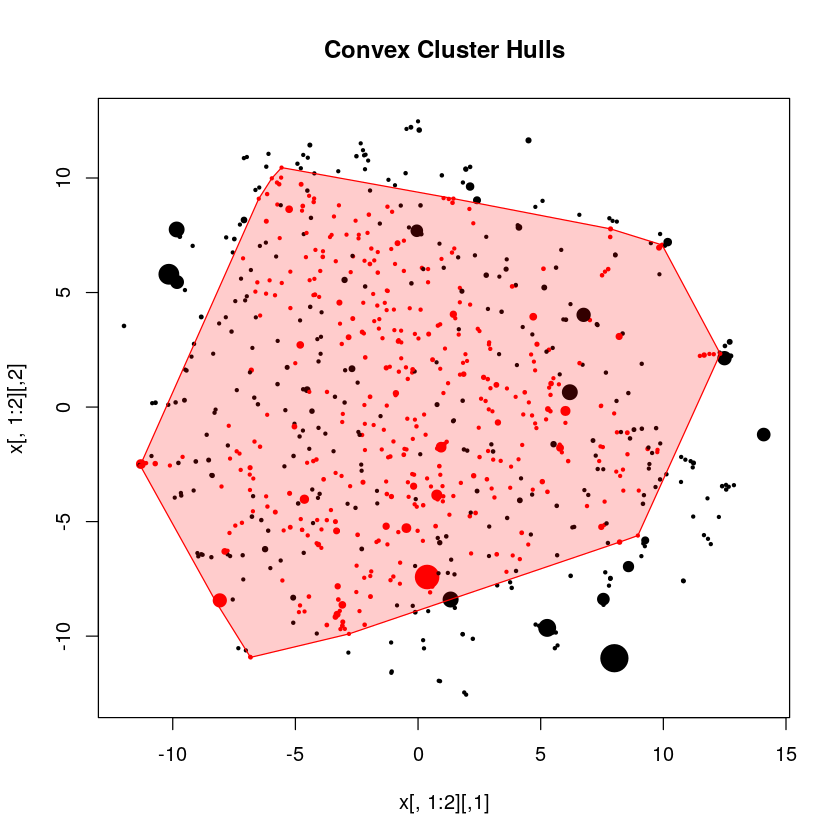

In [139]:
hullplot(tsne$Y, dbs$cluster, pch=20, cex=0.5+4*(subsi$n_vote/max(subsi$n_vote)))